# Covid 19 analysis - Time series model
- We are given data of John Hopkinson's institute repository which covers the counts of covid 19 cases, specified by province/state, country/region, latitute and longiture from 22nd jan 2020 to 21st september 2020.
- A total of 3 files are provided, each accounting the number of confirmed covid cases, the deaths and recoveries 
- We are to give
    - analysis report on entire data
    - Create a predictive model by using a part of the data as training data and the remaining data to be test data.
    - Make suggestions to health department of respective regions based on the data

## Import the Libraries and load required data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option('display.max_rows', None)

In [3]:
#Read the file
data_confirmed = pd.read_csv('time_series_covid19_confirmed_global.csv')
data_deaths = pd.read_csv('time_series_covid19_deaths_global.csv')
data_recovered = pd.read_csv('time_series_covid19_recovered_global.csv')

## Basic Data Checks and Cleaning/rearranging:

In [4]:
#View the confirmed data first
data_confirmed

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,38641,38716,38772,38815,38855,38872,38883,38919,39044,39074
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,11185,11353,11520,11672,11816,11948,12073,12226,12385,12535
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,48007,48254,48496,48734,48966,49194,49413,49623,49826,50023
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,1344,1344,1438,1438,1483,1483,1564,1564,1564,1681
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,3335,3388,3439,3569,3675,3789,3848,3901,3991,4117
5,NaN,Antigua and Barbuda,17.060800,-61.796400,0,0,0,0,0,0,...,95,95,95,95,95,95,95,96,96,96
6,NaN,Argentina,-38.416100,-63.616700,0,0,0,0,0,0,...,546481,555537,565446,577338,589012,601713,613658,622934,631365,640147
7,NaN,Armenia,40.069100,45.038200,0,0,0,0,0,0,...,45675,45862,45969,46119,46376,46671,46910,47154,47431,47552
8,Australian Capital Territory,Australia,-35.473500,149.012400,0,0,0,0,0,0,...,113,113,113,113,113,113,113,113,113,113
9,New South Wales,Australia,-33.868800,151.209300,0,0,0,0,3,4,...,4166,4170,4177,4185,4190,4196,4198,4200,4204,4206


In [5]:
data_confirmed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Columns: 248 entries, Province/State to 9/21/20
dtypes: float64(2), int64(244), object(2)
memory usage: 515.5+ KB


In [6]:
data_confirmed.isnull().sum()
#The data is super-clean, with no null values. Regarding the distribution of data, since covid 19 was a onbreak
# we cannot use statistical means to figure out the data distribution and outliers.

Province/State    185
Country/Region      0
Lat                 0
Long                0
1/22/20             0
1/23/20             0
1/24/20             0
1/25/20             0
1/26/20             0
1/27/20             0
1/28/20             0
1/29/20             0
1/30/20             0
1/31/20             0
2/1/20              0
2/2/20              0
2/3/20              0
2/4/20              0
2/5/20              0
2/6/20              0
2/7/20              0
2/8/20              0
2/9/20              0
2/10/20             0
2/11/20             0
2/12/20             0
2/13/20             0
2/14/20             0
2/15/20             0
2/16/20             0
2/17/20             0
2/18/20             0
2/19/20             0
2/20/20             0
2/21/20             0
2/22/20             0
2/23/20             0
2/24/20             0
2/25/20             0
2/26/20             0
2/27/20             0
2/28/20             0
2/29/20             0
3/1/20              0
3/2/20              0
3/3/20    

In [7]:
#Re-form the table into a convenient timeseries
data_confirmed.describe()

,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
count,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,...,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02
mean,21.076624,22.829441,2.086466,2.458647,3.537594,5.390977,7.962406,11.003759,20.969925,23.180451,...,1.081163e+05,1.090052e+05,1.100551e+05,1.111201e+05,1.122630e+05,1.134410e+05,1.146599e+05,1.157171e+05,1.166240e+05,1.174654e+05
std,24.904600,70.191330,27.279200,27.377862,34.083035,47.434934,66.289178,89.313757,219.187744,220.524977,...,5.678329e+05,5.727452e+05,5.774877e+05,5.831820e+05,5.891235e+05,5.953081e+05,6.017349e+05,6.076737e+05,6.126599e+05,6.154886e+05
min,-51.796300,-135.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,6.677575,-15.277675,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,4.672500e+02,4.675000e+02,4.675000e+02,4.682500e+02,4.682500e+02,4.707500e+02,4.707500e+02,4.707500e+02,4.707500e+02,4.710000e+02
50%,22.820850,20.921188,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.354500e+03,3.381000e+03,3.397000e+03,3.459000e+03,3.466000e+03,3.522500e+03,3.608000e+03,3.714500e+03,3.772000e+03,3.823500e+03
75%,41.143200,77.913685,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.472475e+04,3.540750e+04,3.553900e+04,3.580200e+04,3.599400e+04,3.639525e+04,3.670825e+04,3.731275e+04,3.781650e+04,3.826325e+04
max,71.706900,178.065000,444.000000,444.000000,549.000000,761.000000,1058.000000,1423.000000,3554.000000,3554.000000,...,6.485123e+06,6.520122e+06,6.553652e+06,6.592342e+06,6.630051e+06,6.674411e+06,6.723933e+06,6.768119e+06,6.804814e+06,6.856884e+06


In [8]:
#Viewing the data of object columns
data_confirmed.describe(include='O')

,Province/State,Country/Region
count,81,266
unique,81,188
top,Australian Capital Territory,China
freq,1,33


In [9]:
data_confirmed['Province/State'].unique()
#Seems there are some ships names too

array([nan, 'Australian Capital Territory', 'New South Wales',
       'Northern Territory', 'Queensland', 'South Australia', 'Tasmania',
       'Victoria', 'Western Australia', 'Alberta', 'British Columbia',
       'Diamond Princess', 'Grand Princess', 'Manitoba', 'New Brunswick',
       'Newfoundland and Labrador', 'Northwest Territories',
       'Nova Scotia', 'Ontario', 'Prince Edward Island', 'Quebec',
       'Saskatchewan', 'Yukon', 'Anhui', 'Beijing', 'Chongqing', 'Fujian',
       'Gansu', 'Guangdong', 'Guangxi', 'Guizhou', 'Hainan', 'Hebei',
       'Heilongjiang', 'Henan', 'Hong Kong', 'Hubei', 'Hunan',
       'Inner Mongolia', 'Jiangsu', 'Jiangxi', 'Jilin', 'Liaoning',
       'Macau', 'Ningxia', 'Qinghai', 'Shaanxi', 'Shandong', 'Shanghai',
       'Shanxi', 'Sichuan', 'Tianjin', 'Tibet', 'Xinjiang', 'Yunnan',
       'Zhejiang', 'Faroe Islands', 'Greenland', 'French Guiana',
       'French Polynesia', 'Guadeloupe', 'Martinique', 'Mayotte',
       'New Caledonia', 'Reunion', 'Sai

In [10]:
#Both ship data has country as canada
data_confirmed.loc[(data_confirmed['Province/State'] == 'Diamond Princess')|(data_confirmed['Province/State'] == 'Grand Princess')]

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
41,Diamond Princess,Canada,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
42,Grand Princess,Canada,0.0,0.0,0,0,0,0,0,0,...,13,13,13,13,13,13,13,13,13,13


In [11]:
#Unique values of country column
data_confirmed['Country/Region'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Diamond Princess', 'Djibouti', 'Dominica', 'Dominican Republic',
       'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea',
       'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
       'Grenada', 'Guatemala', 'Guin

In [12]:
data_confirmed['Country/Region'].value_counts()
#There seem to be more rows belonging to china, canada, UK, France, Australia, Netherlands, Denmark. 
#We'll still however continue with countrywise data

China                               33
Canada                              14
United Kingdom                      11
France                              11
Australia                            8
Netherlands                          5
Denmark                              3
Pakistan                             1
New Zealand                          1
Nicaragua                            1
Niger                                1
Nigeria                              1
North Macedonia                      1
Norway                               1
Oman                                 1
Afghanistan                          1
Nepal                                1
Papua New Guinea                     1
Paraguay                             1
Peru                                 1
Philippines                          1
Poland                               1
Portugal                             1
Qatar                                1
Romania                              1
Panama                   

In [13]:
#Since we need a time series data, re-ordering and reframing the dataframe with country,dates,counts as columns
#Since data of a country makes more sense than going by province/state wise, we proceed to groupby the data with country name, and sum the counts of all states in it
df = data_confirmed.groupby(['Country/Region']).sum()
data_conf = df.drop(['Lat','Long'],axis=1)
confirmed = data_conf.transpose()
confirmed

Country/Region,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
1/22/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0,0,4,0,...,0,0,0,0,2,0,0,0,0,0
1/27/20,0,0,0,0,0,0,0,0,5,0,...,0,0,0,0,2,0,0,0,0,0
1/28/20,0,0,0,0,0,0,0,0,5,0,...,0,0,0,0,2,0,0,0,0,0
1/29/20,0,0,0,0,0,0,0,0,6,0,...,0,0,0,0,2,0,0,0,0,0
1/30/20,0,0,0,0,0,0,0,0,9,0,...,0,0,0,0,2,0,0,0,0,0
1/31/20,0,0,0,0,0,0,0,0,9,0,...,2,0,0,0,2,0,0,0,0,0


In [14]:
confirmed.index.dtype

dtype('O')

In [15]:
confirmed.index = pd.to_datetime(confirmed.index)

In [16]:
confirmed.index.dtype

dtype('<M8[ns]')

In [23]:
confirmed.values

array([['Afghanistan', 'Albania', 'Algeria', ..., 'Yemen', 'Zambia',
        'Zimbabwe'],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [38919, 12226, 49623, ..., 2026, 14070, 7672],
       [39044, 12385, 49826, ..., 2026, 14131, 7683],
       [39074, 12535, 50023, ..., 2028, 14175, 7683]], dtype=object)

In [17]:
#Adopting the same process to other two datasets, 'deaths' and 'recovered'
data_deaths

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,1420,1420,1425,1426,1436,1436,1437,1437,1441,1444
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,330,334,338,340,343,347,353,358,362,364
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,1605,1612,1620,1632,1645,1654,1659,1665,1672,1679
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,53,53,53,53,53,53,53,53,53,53
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,132,134,136,139,143,144,147,147,152,154
5,NaN,Antigua and Barbuda,17.060800,-61.796400,0,0,0,0,0,0,...,3,3,3,3,3,3,3,3,3,3
6,NaN,Argentina,-38.416100,-63.616700,0,0,0,0,0,0,...,11263,11352,11667,11852,12116,12460,12656,12799,13053,13482
7,NaN,Armenia,40.069100,45.038200,0,0,0,0,0,0,...,911,916,919,920,923,925,926,928,930,936
8,Australian Capital Territory,Australia,-35.473500,149.012400,0,0,0,0,0,0,...,3,3,3,3,3,3,3,3,3,3
9,New South Wales,Australia,-33.868800,151.209300,0,0,0,0,0,0,...,52,52,52,52,52,52,52,53,53,53


In [18]:
data_deaths.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Columns: 248 entries, Province/State to 9/21/20
dtypes: float64(2), int64(244), object(2)
memory usage: 515.5+ KB


In [19]:
data_deaths.describe()

,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
count,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,...,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000
mean,21.076624,22.829441,0.063910,0.067669,0.097744,0.157895,0.210526,0.308271,0.492481,0.500000,...,3459.515038,3473.206767,3489.860902,3514.481203,3536.109023,3556.620301,3578.071429,3597.740602,3611.635338,3622.906015
std,24.904600,70.191330,1.042337,1.043908,1.473615,2.453621,3.189730,4.660845,7.664297,7.664793,...,16398.950919,16453.471108,16510.259597,16636.850630,16739.311674,16831.543769,16934.234212,17019.787840,17068.307397,17102.864472
min,-51.796300,-135.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.677575,-15.277675,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,5.000000,5.250000,5.250000,5.250000,5.250000,5.250000,5.250000,5.250000,5.250000,5.250000
50%,22.820850,20.921188,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,57.000000,57.000000,57.000000,58.000000,59.000000,60.500000,61.500000,62.500000,64.000000,64.500000
75%,41.143200,77.913685,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,588.000000,588.250000,611.500000,620.500000,620.500000,622.500000,629.000000,635.750000,645.500000,647.500000
max,71.706900,178.065000,17.000000,17.000000,24.000000,40.000000,52.000000,76.000000,125.000000,125.000000,...,193693.000000,194071.000000,194493.000000,195781.000000,196763.000000,197633.000000,198570.000000,199282.000000,199509.000000,199865.000000


In [20]:
data_deaths.describe(include = 'O')

,Province/State,Country/Region
count,81,266
unique,81,188
top,Australian Capital Territory,China
freq,1,33


In [21]:
data_deaths.isnull().sum()
#The data set is clean, requiring no need for cleaning
#We shall not statistically analyse the values and outliers as this is a time series data of a catastrophic outbreak

Province/State    185
Country/Region      0
Lat                 0
Long                0
1/22/20             0
1/23/20             0
1/24/20             0
1/25/20             0
1/26/20             0
1/27/20             0
1/28/20             0
1/29/20             0
1/30/20             0
1/31/20             0
2/1/20              0
2/2/20              0
2/3/20              0
2/4/20              0
2/5/20              0
2/6/20              0
2/7/20              0
2/8/20              0
2/9/20              0
2/10/20             0
2/11/20             0
2/12/20             0
2/13/20             0
2/14/20             0
2/15/20             0
2/16/20             0
2/17/20             0
2/18/20             0
2/19/20             0
2/20/20             0
2/21/20             0
2/22/20             0
2/23/20             0
2/24/20             0
2/25/20             0
2/26/20             0
2/27/20             0
2/28/20             0
2/29/20             0
3/1/20              0
3/2/20              0
3/3/20    

In [22]:
data_deaths['Country/Region'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Diamond Princess', 'Djibouti', 'Dominica', 'Dominican Republic',
       'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea',
       'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
       'Grenada', 'Guatemala', 'Guin

In [23]:
data_deaths['Country/Region'].value_counts()
#This data set seemingly has same value counts for each country as the confirmed cases dataset

China                               33
Canada                              14
United Kingdom                      11
France                              11
Australia                            8
Netherlands                          5
Denmark                              3
Pakistan                             1
New Zealand                          1
Nicaragua                            1
Niger                                1
Nigeria                              1
North Macedonia                      1
Norway                               1
Oman                                 1
Afghanistan                          1
Nepal                                1
Papua New Guinea                     1
Paraguay                             1
Peru                                 1
Philippines                          1
Poland                               1
Portugal                             1
Qatar                                1
Romania                              1
Panama                   

In [24]:
df_temp = data_deaths.groupby(['Country/Region']).sum() #Grouping the data country wise, by summing up the grouped values of each province
df_temp = df_temp.drop(['Lat','Long'],axis=1) #Dropping the latitude and longitude columns
deaths = df_temp.transpose()

In [25]:
deaths

Country/Region,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
1/22/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/27/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/28/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/29/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/30/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/31/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [26]:
deaths.index.dtype

dtype('O')

In [27]:
deaths.index = pd.to_datetime(deaths.index)

In [28]:
deaths.index.dtype

dtype('<M8[ns]')

In [29]:
data_recovered

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,31234,31638,32073,32098,32503,32505,32576,32576,32576,32576
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,6494,6569,6615,6668,6733,6788,6831,6888,6940,6995
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,33875,34037,34204,34385,34517,34675,34818,34923,35047,35180
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,943,943,945,945,1054,1054,1164,1164,1164,1199
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,1289,1301,1324,1332,1401,1405,1443,1445,1445,1449
5,NaN,Antigua and Barbuda,17.060800,-61.796400,0,0,0,0,0,0,...,91,91,91,91,91,91,92,92,92,92
6,NaN,Argentina,-38.416100,-63.616700,0,0,0,0,0,0,...,409771,419513,428953,438883,448263,456347,467286,478077,488231,508563
7,NaN,Armenia,40.069100,45.038200,0,0,0,0,0,0,...,41605,41659,41693,41941,42069,42231,42369,42551,42608,42637
8,Australian Capital Territory,Australia,-35.473500,149.012400,0,0,0,0,0,0,...,110,110,110,110,110,110,110,110,110,110
9,New South Wales,Australia,-33.868800,151.209300,0,0,0,0,0,0,...,2994,2994,2994,2994,2994,2994,2994,2994,2994,2994


In [30]:
data_recovered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253 entries, 0 to 252
Columns: 248 entries, Province/State to 9/21/20
dtypes: float64(2), int64(244), object(2)
memory usage: 490.3+ KB


In [31]:
data_recovered.describe()

,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
count,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,...,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02
mean,19.835137,27.997068,0.110672,0.118577,0.142292,0.154150,0.205534,0.241107,0.422925,0.498024,...,7.683461e+04,7.756891e+04,7.847586e+04,7.936355e+04,8.026853e+04,8.113512e+04,8.213040e+04,8.307036e+04,8.400322e+04,8.456361e+04
std,24.504550,67.358197,1.760345,1.764332,1.954723,2.020714,2.649732,2.852382,5.059859,5.566071,...,3.738531e+05,3.774536e+05,3.831228e+05,3.886656e+05,3.941652e+05,3.993233e+05,4.045893e+05,4.106165e+05,4.159772e+05,4.178944e+05
min,-51.796300,-106.346800,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,6.428055,-8.224500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.680000e+02,3.740000e+02,3.740000e+02,3.740000e+02,3.740000e+02,3.740000e+02,3.740000e+02,3.740000e+02,3.800000e+02,3.800000e+02
50%,21.521757,23.881300,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.991000e+03,1.991000e+03,2.071000e+03,2.094000e+03,2.104000e+03,2.112000e+03,2.128000e+03,2.197000e+03,2.239000e+03,2.369000e+03
75%,39.305400,85.240100,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.997900e+04,2.008200e+04,2.120600e+04,2.153600e+04,2.175200e+04,2.266200e+04,2.316000e+04,2.336400e+04,2.336400e+04,2.336400e+04
max,71.706900,178.065000,28.000000,28.000000,31.000000,32.000000,42.000000,45.000000,80.000000,88.000000,...,3.723206e+06,3.780107e+06,3.859399e+06,3.942360e+06,4.025079e+06,4.112551e+06,4.208431e+06,4.303043e+06,4.396399e+06,4.396399e+06


In [32]:
data_recovered.describe(include='O')

,Province/State,Country/Region
count,67,253
unique,67,188
top,Australian Capital Territory,China
freq,1,33


In [33]:
data_recovered['Country/Region'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Diamond Princess', 'Djibouti', 'Dominica', 'Dominican Republic',
       'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea',
       'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
       'Grenada', 'Guatemala', 'Guin

In [34]:
data_recovered['Country/Region'].value_counts()

China                               33
France                              11
United Kingdom                      11
Australia                            8
Netherlands                          5
Denmark                              3
Afghanistan                          1
New Zealand                          1
Nicaragua                            1
Niger                                1
Nigeria                              1
North Macedonia                      1
Norway                               1
Oman                                 1
Panama                               1
Pakistan                             1
Namibia                              1
Papua New Guinea                     1
Paraguay                             1
Peru                                 1
Philippines                          1
Poland                               1
Portugal                             1
Qatar                                1
Romania                              1
Nepal                    

In [35]:
temp = data_recovered.groupby('Country/Region').sum()
temp = temp.drop(['Lat','Long'],axis=1)
recovered = temp.transpose()

In [36]:
recovered

Country/Region,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
1/22/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/27/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/28/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/29/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/30/20,0,0,0,0,0,0,0,0,2,0,...,0,0,0,0,0,0,0,0,0,0
1/31/20,0,0,0,0,0,0,0,0,2,0,...,0,0,0,0,0,0,0,0,0,0


In [37]:
recovered.index.dtype

dtype('O')

In [38]:
recovered.index = pd.to_datetime(recovered.index)

In [39]:
recovered.index.dtype

dtype('<M8[ns]')

## Data Preprocessing

In [40]:
from datetime import datetime as dt
A = recovered.index.strftime('%d %b')
A

Index(['22 Jan', '23 Jan', '24 Jan', '25 Jan', '26 Jan', '27 Jan', '28 Jan',
       '29 Jan', '30 Jan', '31 Jan',
       ...
       '12 Sep', '13 Sep', '14 Sep', '15 Sep', '16 Sep', '17 Sep', '18 Sep',
       '19 Sep', '20 Sep', '21 Sep'],
      dtype='object', length=244)

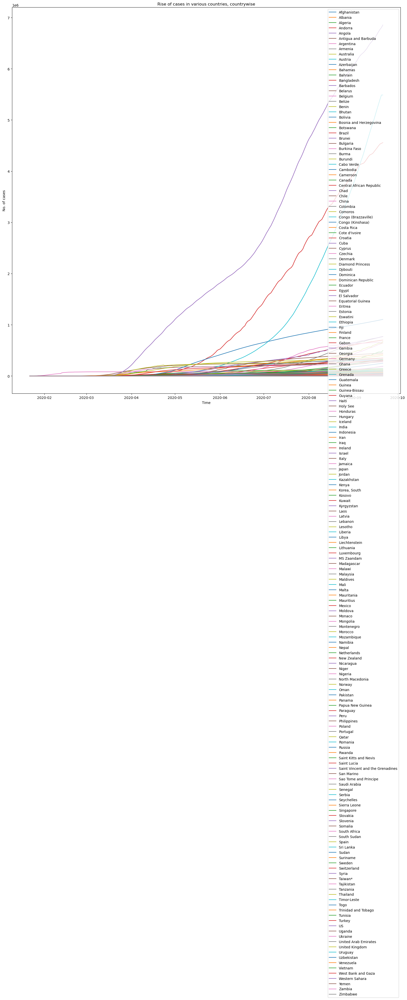

In [41]:
plt.figure(figsize = (20,20))
for i in confirmed.columns:
    plt.plot(confirmed.loc[:,i],label=i)
    plt.legend()
    plt.ylabel("No. of cases")
    plt.xlabel("Time")
    plt.title('Rise of cases in various countries, countrywise')

In [42]:
confirmed.iloc[:,0]

2020-01-22        0
2020-01-23        0
2020-01-24        0
2020-01-25        0
2020-01-26        0
2020-01-27        0
2020-01-28        0
2020-01-29        0
2020-01-30        0
2020-01-31        0
2020-02-01        0
2020-02-02        0
2020-02-03        0
2020-02-04        0
2020-02-05        0
2020-02-06        0
2020-02-07        0
2020-02-08        0
2020-02-09        0
2020-02-10        0
2020-02-11        0
2020-02-12        0
2020-02-13        0
2020-02-14        0
2020-02-15        0
2020-02-16        0
2020-02-17        0
2020-02-18        0
2020-02-19        0
2020-02-20        0
2020-02-21        0
2020-02-22        0
2020-02-23        0
2020-02-24        1
2020-02-25        1
2020-02-26        1
2020-02-27        1
2020-02-28        1
2020-02-29        1
2020-03-01        1
2020-03-02        1
2020-03-03        1
2020-03-04        1
2020-03-05        1
2020-03-06        1
2020-03-07        1
2020-03-08        4
2020-03-09        4
2020-03-10        5
2020-03-11        7


Text(0, 0.5, 'No. of cases')

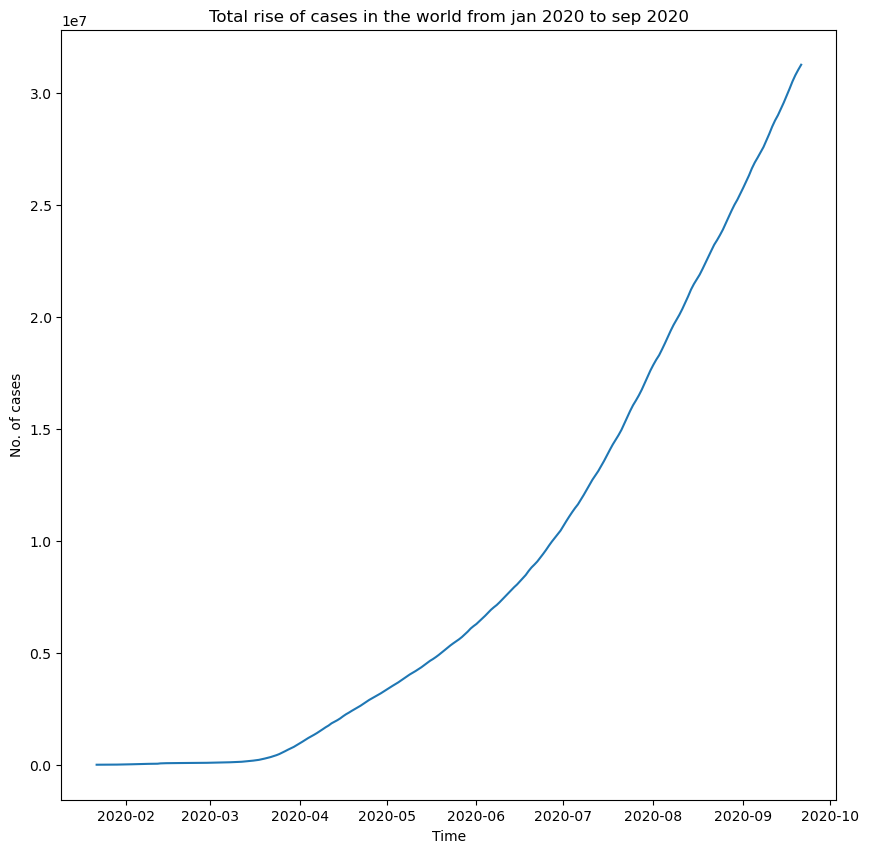

In [43]:
plt.figure(figsize = (10,10))
plt.plot(confirmed.sum(axis=1))
plt.title('Total rise of cases in the world from jan 2020 to sep 2020')
plt.xlabel('Time')
plt.ylabel('No. of cases')

Text(0, 0.5, 'No. of cases')

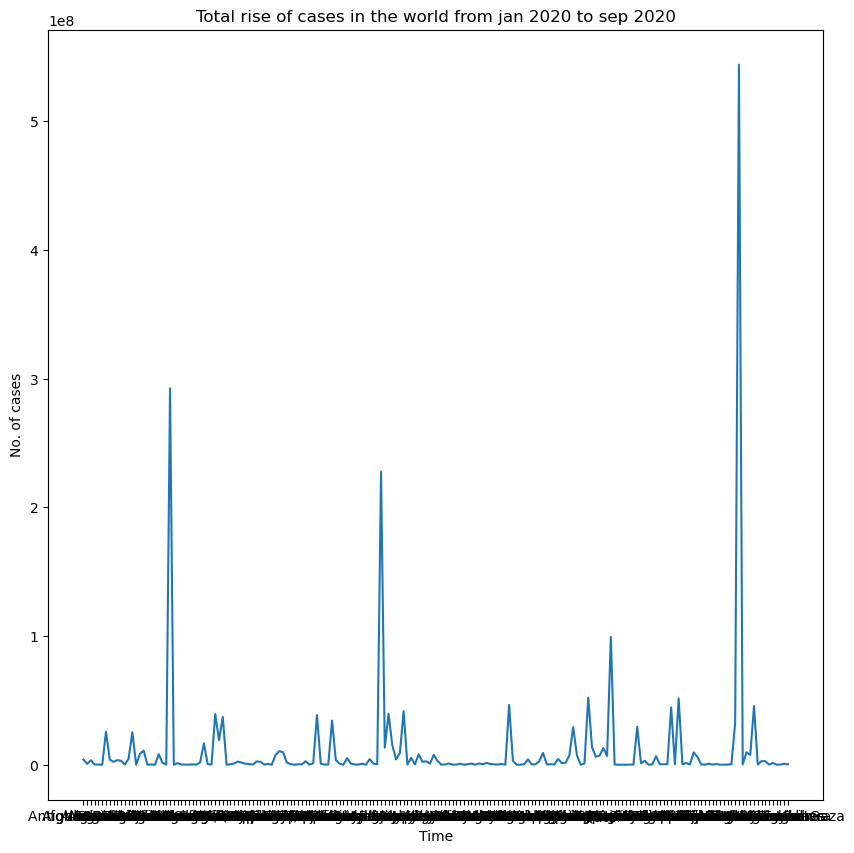

Text(0.5, 410.7222222222222, 'Count of total confirmed cases over Jan to September')

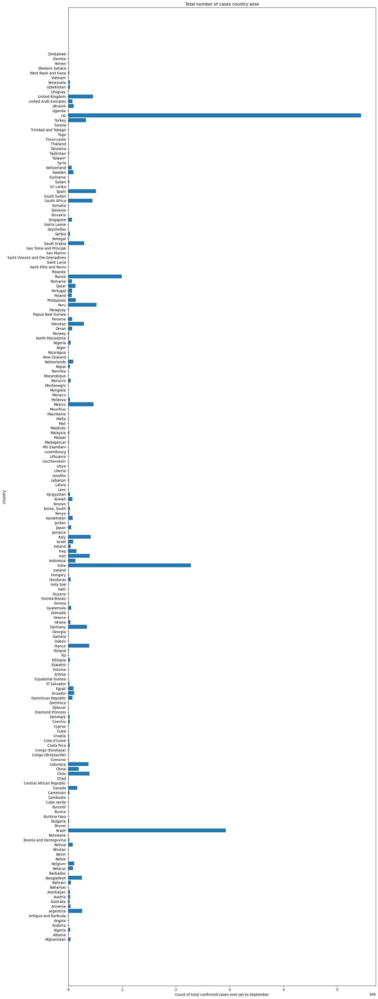

In [44]:
plt.figure(figsize = (15,40))
plt.barh(confirmed.columns, confirmed.sum(axis=0))
plt.title('Total number of cases country wise')
plt.tight_layout()
plt.ylabel('Country')
plt.xlabel('Count of total confirmed cases over Jan to September')

In [45]:
temp = confirmed.sum(axis=0)
temp.sort_values(ascending=False,inplace=True)
temp

Country/Region
US                                  544027944
Brazil                              292482604
India                               227870813
Russia                               99270602
Peru                                 52184232
Spain                                51527717
Mexico                               46491871
United Kingdom                       45582390
South Africa                         44592708
Italy                                41630885
Iran                                 39540364
Chile                                39327635
France                               38565392
Colombia                             37143327
Germany                              34378718
Turkey                               32616098
Saudi Arabia                         29494008
Pakistan                             29202388
Argentina                            25658804
Bangladesh                           25266123
China                                19137543
Canada             

In [46]:
temp[3:].sum()

1102250857

## Insights from line plots of confirmed cases:
- 25% of the world wide confirmed cases are from US. US, together with brazil and India contribute to more than 50% of total confirmed cases in the world.
- The total number of cases rose from less than a few hundreds (550) in Jan 2020 to over 30 million by end of September 2020
- From the graph of rise in confirmed cases from Jan to September in different countries, it is evident that the countries that had steep increase rate in the cases are mostly african countries like, Gambia, Djoubouti, Egypt, that can be attributed to their underdeveloped status.

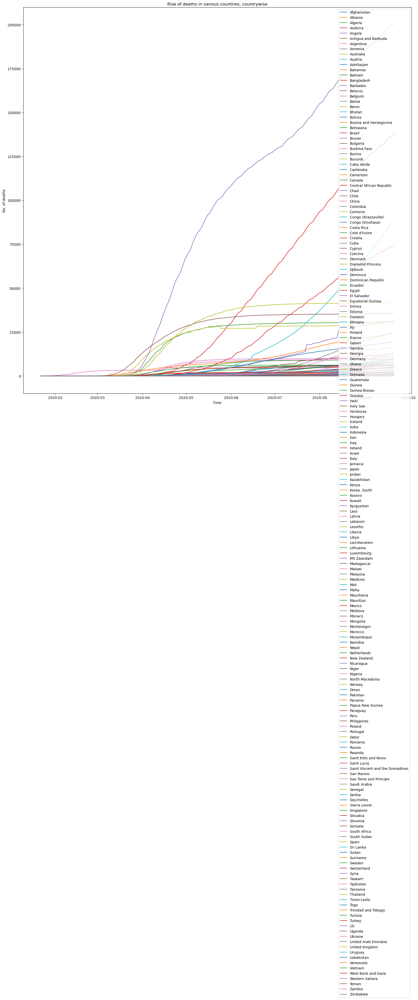

In [47]:
plt.figure(figsize = (20,20))
for i in deaths.columns:
    plt.plot(deaths.loc[:,i],label=i)
    plt.legend()
    plt.ylabel("No. of deaths")
    plt.xlabel("Time")
    plt.title('Rise of deaths in various countries, countrywise')

In [48]:
deaths.iloc[0].sum()

17

Text(0, 0.5, 'No. of deaths')

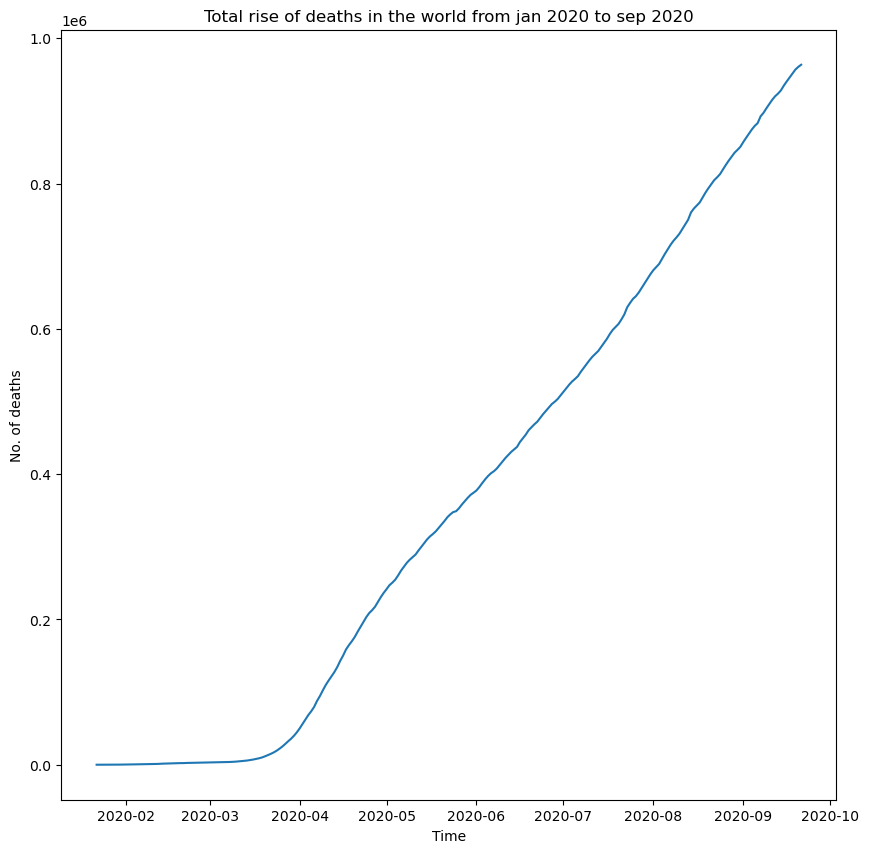

In [49]:
plt.figure(figsize = (10,10))
plt.plot(deaths.sum(axis=1))
plt.title('Total rise of deaths in the world from jan 2020 to sep 2020')
plt.xlabel('Time')
plt.ylabel('No. of deaths')

Text(0.5, 410.7222222222222, 'Count of total deaths over Jan to September')

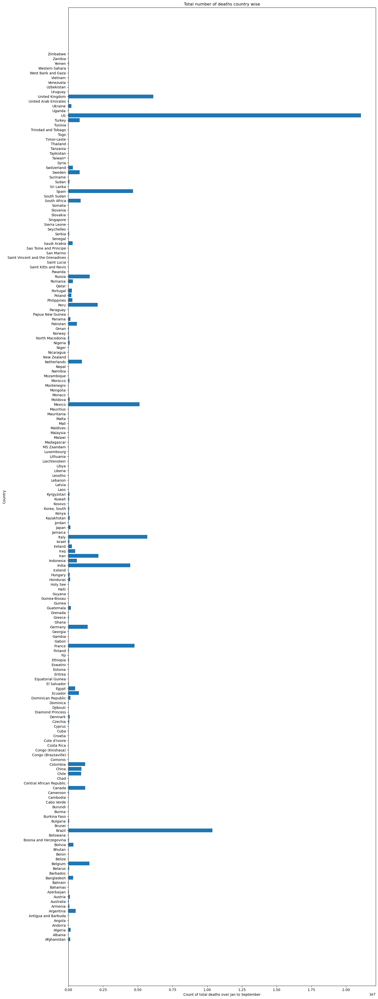

In [50]:
plt.figure(figsize = (15,40))
plt.barh(deaths.columns, deaths.sum(axis=0))
plt.title('Total number of deaths country wise')
plt.tight_layout()
plt.ylabel('Country')
plt.xlabel('Count of total deaths over Jan to September')

In [51]:
temp = deaths.sum(axis=0)
temp.sort_values(ascending=False,inplace=True)
temp

Country/Region
US                                  21081574
Brazil                              10381569
United Kingdom                       6114676
Italy                                5690917
Mexico                               5126971
France                               4762101
Spain                                4662847
India                                4461695
Iran                                 2177404
Peru                                 2122267
Russia                               1543146
Belgium                              1518598
Germany                              1390500
Colombia                             1211814
Canada                               1210567
Netherlands                           971367
China                                 936100
Chile                                 932142
South Africa                          893014
Turkey                                820739
Sweden                                810403
Ecuador                               76

In [52]:
temp[2:].sum()

57540838

## Insights from line plots of deaths:
- From the graph of increase in deaths from january 2020 to september 2020 in various countries, it is evident that, while some coutries like Eswatini, Greece, Guinea were able to curtail the steep increase in rate of deaths, some countries, mostly African, like Egypt, Chad, Central African Republic had steep increase in deaths with progress of time, that never seemingly settled. That way, most asian countries could have a settled and flat death rate.
- However some african countries showed a very less death rate, owing to their strong immunity that comes from their strong cultural roots and exposure to tough climatic conditions.
- 25% of the world wide confirmed deaths are from US. US, together with brazil contribute to more than 35% of total deaths in the world. 
- An observation is that though India had higher number of cases, relatively the deaths have been less
- The total number of deaths rose from 55 in Jan 2020 to over 1 million by end of September 2020

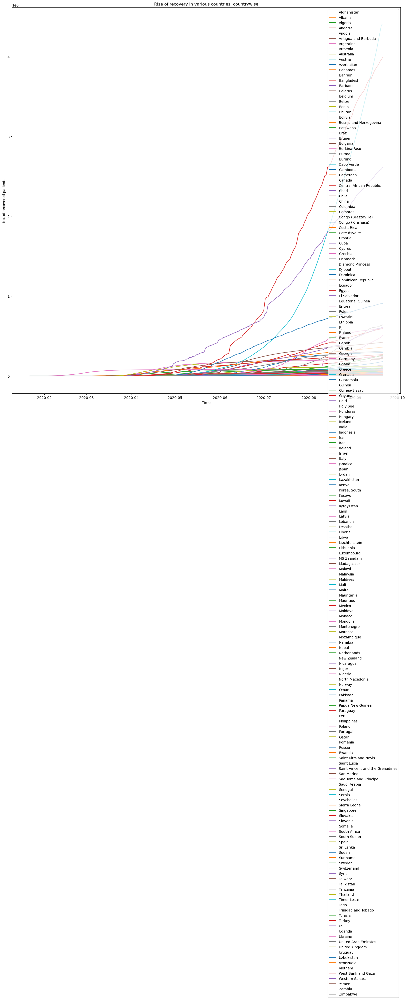

In [53]:
plt.figure(figsize = (20,20))
for i in recovered.columns:
    plt.plot(recovered.loc[:,i],label=i)
    plt.legend()
    plt.ylabel("No. of recovered patients")
    plt.xlabel("Time")
    plt.title('Rise of recovery in various countries, countrywise')

In [54]:
recovered.iloc[0].sum()

28

Text(0, 0.5, 'No. of recovered cases')

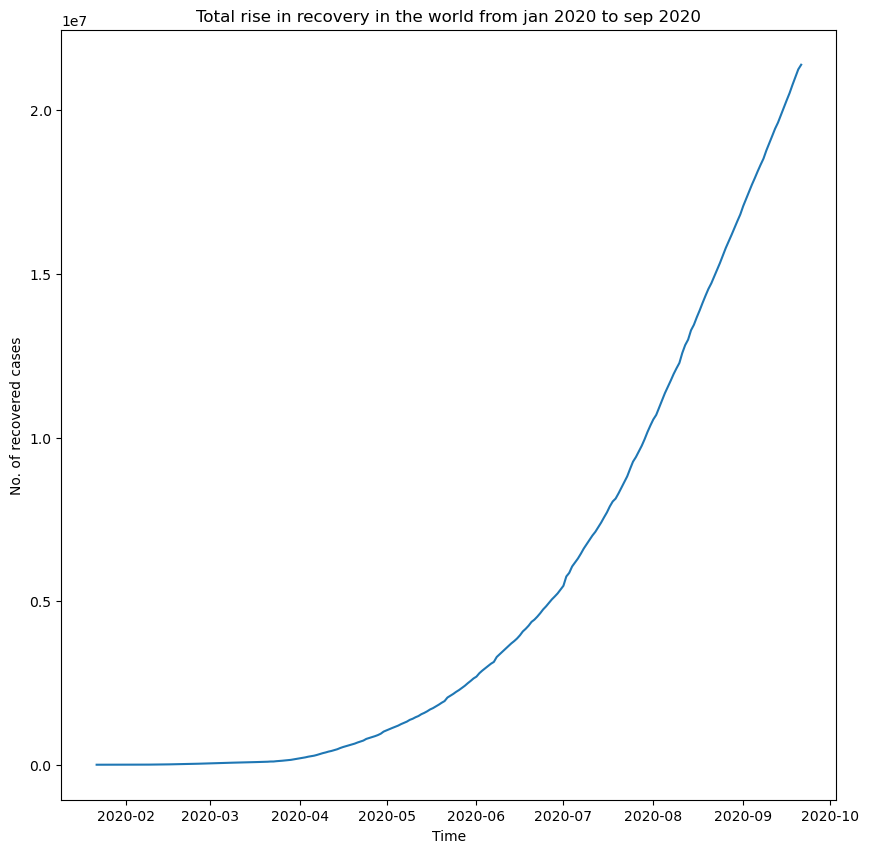

In [55]:
plt.figure(figsize = (10,10))
plt.plot(recovered.sum(axis=1))
plt.title('Total rise in recovery in the world from jan 2020 to sep 2020')
plt.xlabel('Time')
plt.ylabel('No. of recovered cases')

Text(0.5, 410.7222222222222, 'Count of total recovery over Jan to September')

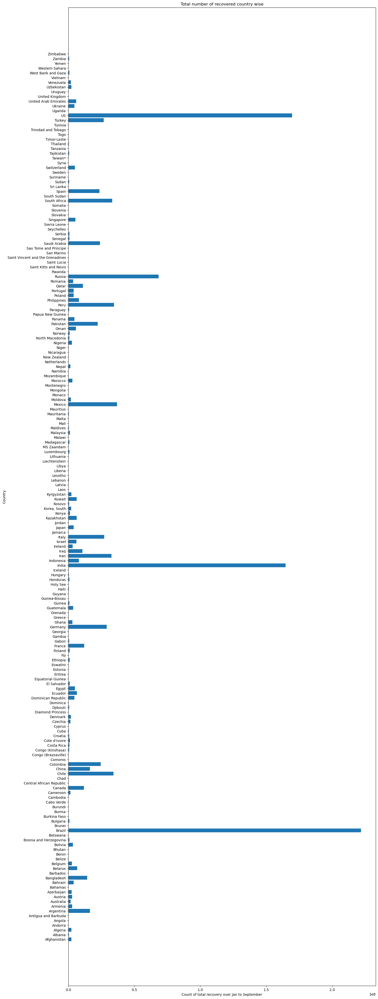

In [56]:
plt.figure(figsize = (15,40))
plt.barh(recovered.columns, recovered.sum(axis=0))
plt.title('Total number of recovered country wise')
plt.tight_layout()
plt.ylabel('Country')
plt.xlabel('Count of total recovery over Jan to September')

In [57]:
temp = recovered.sum(axis=0)
temp.sort_values(ascending=False,inplace=True)
temp

Country/Region
Brazil                              221908946
US                                  169594763
India                               164793895
Russia                               68369584
Mexico                               36967220
Peru                                 34681293
Chile                                34169242
South Africa                         33301273
Iran                                 32631272
Germany                              29011796
Italy                                27259519
Turkey                               26736722
Colombia                             24475963
Saudi Arabia                         23971866
Spain                                23514639
Pakistan                             22240486
Argentina                            16435283
China                                16398871
Bangladesh                           14271551
France                               12007133
Canada                               11882668
Qatar              

In [58]:
temp[3:].sum()

705487969

## Insights from recovery data
- As observed from the recovery rate of different countries from Jan 2020 to September 2020, some countries like Cuba, Croatia and Congo showed quick recovery, possibly owing to their cultural strength and practices. However, the general recovery rate picked up little later.
- The recovery rate rose from 28 count in jan 2020 to around 22 million by september 2020.
- Surprisingly, if we see the recovery rates, 15% of the recovered patients are from Brazil, while 10% are from each of US and India. 

## Observation and analysis of confirmed cases-deaths and recovery from countries that had large number of cases

In [59]:
temp = confirmed.sum(axis=0)
temp.sort_values(ascending=False,inplace=True)
temp[:16]
temp[:16].index

Index(['US', 'Brazil', 'India', 'Russia', 'Peru', 'Spain', 'Mexico',
       'United Kingdom', 'South Africa', 'Italy', 'Iran', 'Chile', 'France',
       'Colombia', 'Germany', 'Turkey'],
      dtype='object', name='Country/Region')

In [60]:
#Making a new dataframe with these countries alone.
temp_confirmed = confirmed[temp[:16].index]
temp_deaths = deaths[temp[:16].index]
temp_recovered = recovered[temp[:16].index]

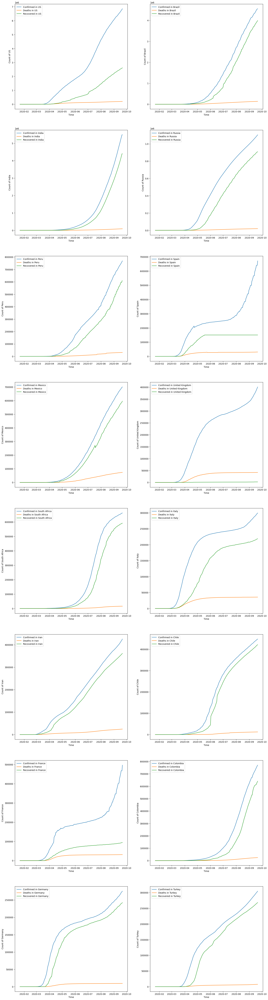

In [61]:
plt.figure(figsize = (20,80))
plt_num = 1
for i in temp[:16].index:
    plt.subplot(8,2,plt_num)
    plt.plot(confirmed.loc[:,i],label='Confirmed in ' + i)
    plt.plot(deaths.loc[:,i],label='Deaths in '+ i)
    plt.plot(recovered.loc[:,i],label='Recovered in '+i)
    plt.xlabel('Time')
    plt.ylabel('Count of '+ i)
    plt_num += 1
    plt.legend()


## Observations from comparing confirmed, recovered and death counts in countries with large cases:
- Brazil, India, Peru, Columbia, Turkey, Germany and Russia had the recovery rate closely matching or following the rise in confirmed cases, due to which the deaths were managed to be less
- Countries like, US, United Kingdom, France, Iran, Chile, Italy, South Africa, Mexico and Spain, seemingly started taking late measures or hadn't had resources to cater to the citizens, due to which the recovery rate couldn't match the rise in confirmed cases. In such a case, it'd be great for a speedy action from the side of government.
- Countries like spain, United kingdom, South Africa and Italy seemingly took time to start control measures, and hence a settling in the graph can be seen after initial months only.
- The graphs of France,Germany and turkey (to some extent) are unique. Seemingly, there was a settled phase,after which it again went out of control. This probably can be attributed to the unpreparedness or lack of enough infrastructure or failure of trend-observation.
- Quicker measures that ensured higher recovery are the key to balanced or low death rate.
- An alarming observation that is of real concern to us is that the graphs in India don't seem to be going towards a settlement, rather its rising exponentially. Though the recovery rates is also decently following, owing to the quicker and efficient contribution from medical caregivers, keeping the deaths at bay, it is however recommended to aim at controlling the number of cases, since it is not good for the economy and nation as well. 

### Model to observe the data and pattern-graph of any country

Which country would you like to observe?India


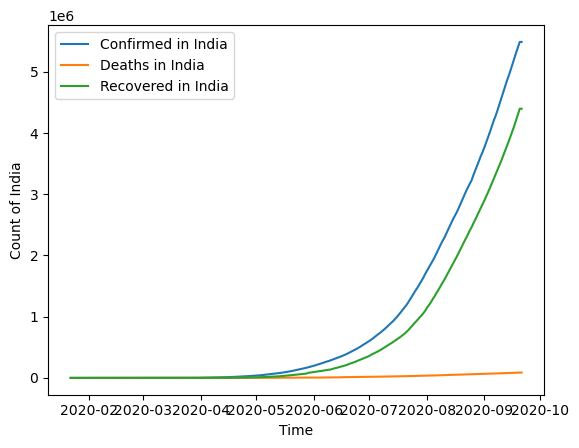

,Confirmed,deaths,recovered
2020-01-22,0,0,0
2020-01-23,0,0,0
2020-01-24,0,0,0
2020-01-25,0,0,0
2020-01-26,0,0,0
2020-01-27,0,0,0
2020-01-28,0,0,0
2020-01-29,0,0,0
2020-01-30,1,0,0
2020-01-31,1,0,0


In [62]:
#Lets develop an user interactive model that shows the data as well as plot of confirmed, recovered and deaths in country that one wishes to see
country = input('Which country would you like to observe?')
plt.plot(confirmed.loc[:,country],label='Confirmed in ' + country)
plt.plot(deaths.loc[:,country],label='Deaths in '+ country)
plt.plot(recovered.loc[:,country],label='Recovered in '+ country)
plt.xlabel('Time')
plt.ylabel('Count of '+ country)
plt.legend()
plt.show()
df_temp = pd.DataFrame()
df_temp['Confirmed'] = confirmed.loc[:,country]
df_temp['deaths'] = deaths.loc[:,country]
df_temp['recovered'] = recovered.loc[:,country]
df_temp

# TASK 1: DETAILED ANALYSIS of the data.
- The graphs were presented and observations are made whenever relevant and possible. However, it is being presented again for the ease of summarising the whole content and providing a bird's eye point of view of the analysis.
## Insights from line plots of confirmed cases:
- 25% of the world wide confirmed cases are from US. US, together with brazil and India contribute to more than 50% of total confirmed cases in the world.
- The total number of cases rose from less than a few hundreds (550) in Jan 2020 to over 30 million by end of September 2020
- From the graph of rise in confirmed cases from Jan to September in different countries, it is evident that the countries that had steep increase rate in the cases are mostly african countries like, Gambia, Djoubouti, Egypt, that can be attributed to their underdeveloped status.
## Insights from line plots of deaths:
- From the graph of increase in deaths from january 2020 to september 2020 in various countries, it is evident that, while some coutries like Eswatini, Greece, Guinea were able to curtail the steep increase in rate of deaths, some countries, mostly African, like Egypt, Chad, Central African Republic had steep increase in deaths with progress of time, that never seemingly settled. That way, most asian countries could have a settled and flat death rate.
- However some african countries showed a very less death rate, owing to their strong immunity that comes from their strong cultural roots and exposure to tough climatic conditions.
- 25% of the world wide confirmed deaths are from US. US, together with brazil contribute to more than 35% of total deaths in the world. 
- An observation is that though India had higher number of cases, relatively the deaths have been less
- The total number of deaths rose from 55 in Jan 2020 to over 1 million by end of September 2020
## Insights from recovery data
- As observed from the recovery rate of different countries from Jan 2020 to September 2020, some countries like Cuba, Croatia and Congo showed quick recovery, possibly owing to their cultural strength and practices. However, the general recovery rate picked up little later.
- The recovery rate rose from 28 count in jan 2020 to around 22 million by september 2020.
- Surprisingly, if we see the recovery rates, 15% of the recovered patients are from Brazil, while 10% are from each of US and India. 
## Observations from comparing confirmed, recovered and death counts in countries with large cases:
- Brazil, India, Peru, Columbia, Turkey, Germany and Russia had the recovery rate closely matching or following the rise in confirmed cases, due to which the deaths were managed to be less
- Countries like, US, United Kingdom, France, Iran, Chile, Italy, South Africa, Mexico and Spain, seemingly started taking late measures or hadn't had resources to cater to the citizens, due to which the recovery rate couldn't match the rise in confirmed cases. In such a case, it'd be great for a speedy action from the side of government.
- Countries like spain, United kingdom, South Africa and Italy seemingly took time to start control measures, and hence a settling in the graph can be seen after initial months only.
- The graphs of France,Germany and turkey (to some extent) are unique. Seemingly, there was a settled phase,after which it again went out of control. This probably can be attributed to the unpreparedness or lack of enough infrastructure or failure of trend-observation.
- Quicker measures that ensured higher recovery are the key to balanced or low death rate.
## Analysis of confirmed cases, deaths and recoveries in India
- An alarming observation that is of real concern to us is that the graphs in India don't seem to be going towards a settlement, rather its rising exponentially. Though the recovery rates is also decently following, owing to the quicker and efficient contribution from medical caregivers, keeping the deaths at bay, it is however recommended to aim at controlling the number of cases, since it is not good for the economy and nation as well.
## A model has been presented that gives the graph and data of the country that we choose

# Task 2: Fix a period for prediction of confirmed cases/deaths. Create a predictive model to forecast the Covid19 cases based on past cases for a specific country or region.
## Country is chosen as India and period for prediction is 180-244, while data till 180 rows is used for training the model
 - AR, MA and ARIMA models are considered for modeling, and the ones with best performance in terms of prediction with the test data is considered.
 - The model can be altered to calculate for any country or region by changing the value in the variable 'country' to any desired country or region

In [138]:
country = 'India'
df_temp = pd.DataFrame()
df_temp['Confirmed'] = confirmed.loc[:,country]
df_temp['deaths'] = deaths.loc[:,country]
df_temp['recovered'] = recovered.loc[:,country]
df_temp

,Confirmed,deaths,recovered
2020-01-22,NaN,NaN,NaN
2020-01-23,NaN,NaN,NaN
2020-01-24,NaN,NaN,NaN
2020-01-25,NaN,NaN,NaN
2020-01-26,NaN,NaN,NaN
2020-01-27,NaN,NaN,NaN
2020-01-28,NaN,NaN,NaN
2020-01-29,NaN,NaN,NaN
2020-01-30,inf,NaN,NaN
2020-01-31,0.000000,NaN,NaN


## Modeling: AR, MA, ARMA, ARIMA models
- Since it turns out confusing to model the data of every country, we'll take India and US into consideration, and develop models for them. 
- We'll test AR, MA, ARMA, ARIMA models on them and figure out which works to be the best, based on AIC value.

## Data Preprocessing - Feature selection - Model parameters
#### INDIA data

In [63]:
country='India'
model_df = pd.DataFrame()
model_df['Confirmed'] = confirmed.loc[:,country]
model_df['deaths'] = deaths.loc[:,country]
model_df['recovered'] = recovered.loc[:,country]
model_df

,Confirmed,deaths,recovered
2020-01-22,0,0,0
2020-01-23,0,0,0
2020-01-24,0,0,0
2020-01-25,0,0,0
2020-01-26,0,0,0
2020-01-27,0,0,0
2020-01-28,0,0,0
2020-01-29,0,0,0
2020-01-30,1,0,0
2020-01-31,1,0,0


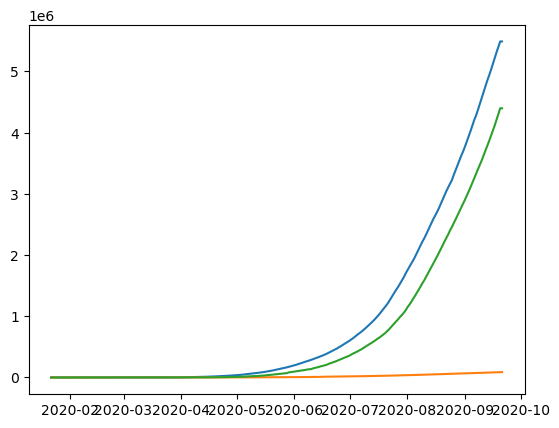

In [64]:
plt.plot(model_df)

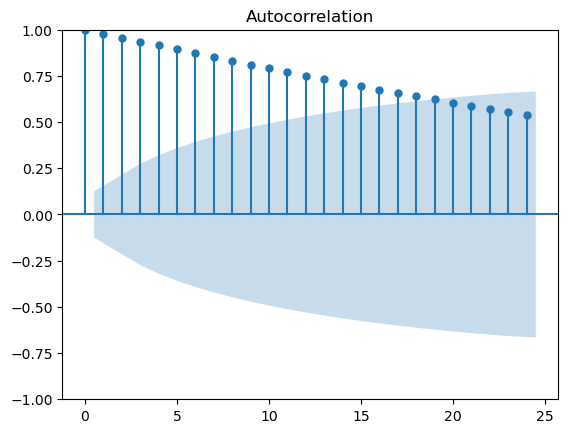

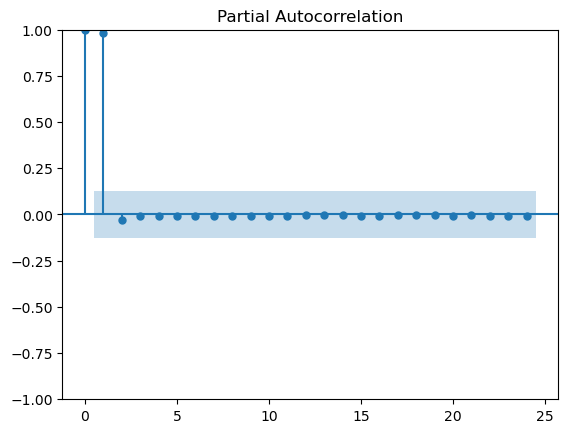

In [65]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
plot_acf(model_df.Confirmed)
plot_pacf(model_df.Confirmed)
plt.show()

- Both the graph and the acf plot show that the data is not stationary.We can however do an adfuller test to have a material proof.

In [66]:
# ADfuller Test to check stationarity

from statsmodels.tsa.stattools import adfuller
dftest = adfuller(model_df.Confirmed, autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -2.3068301760223573
2. P-Value :  0.16977456577419842
3. Num Of Lags :  15
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 228
5. Critical Values :
	 1% :  -3.4593607492757554
	 5% :  -2.8743015807562924
	 10% :  -2.5735714042782396


- Since P>0.05, the data is proved to be non stationary.

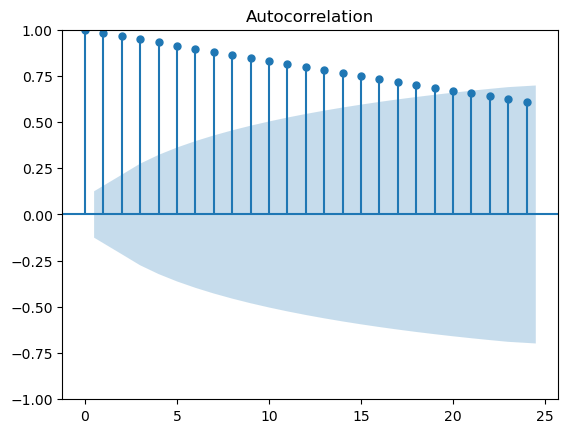

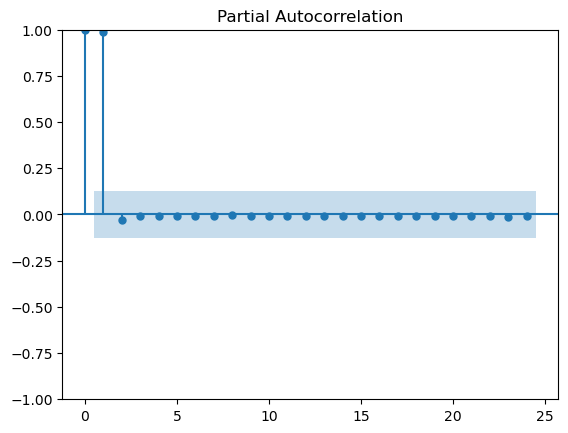

In [67]:
plot_acf(model_df.deaths)
plot_pacf(model_df.deaths)
plt.show()

In [68]:
# ADfuller Test to check stationarity

from statsmodels.tsa.stattools import adfuller
dftest = adfuller(model_df.deaths, autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -0.9522401894402542
2. P-Value :  0.7702828447066555
3. Num Of Lags :  8
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 235
5. Critical Values :
	 1% :  -3.4584868856997004
	 5% :  -2.873918902362675
	 10% :  -2.573367247623359


- the high p value shows that deaths is also non staionary

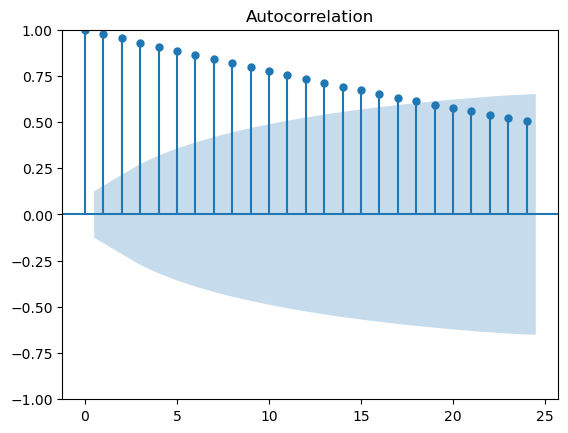

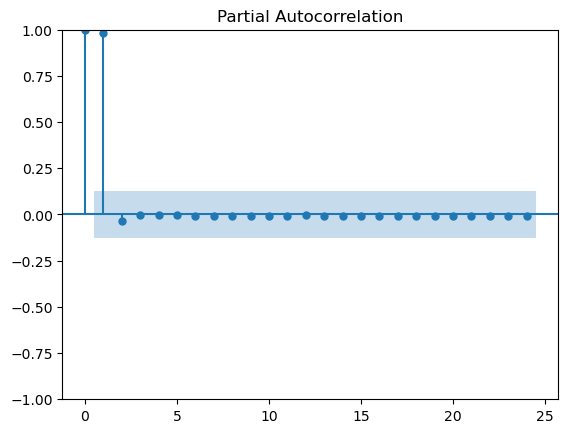

In [69]:
plot_acf(model_df.recovered)
plot_pacf(model_df.recovered)
plt.show()

In [70]:
# ADfuller Test to check stationarity

from statsmodels.tsa.stattools import adfuller
dftest = adfuller(model_df.recovered, autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -2.905867044432211
2. P-Value :  0.044669981516073244
3. Num Of Lags :  14
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 229
5. Critical Values :
	 1% :  -3.4592326027153493
	 5% :  -2.8742454699025872
	 10% :  -2.5735414688888465


- the p value is on borderline, but looking at critical values, it may be given the treatment as non stationary.

2020-01-22        NaN
2020-01-23        0.0
2020-01-24        0.0
2020-01-25        0.0
2020-01-26        0.0
2020-01-27        0.0
2020-01-28        0.0
2020-01-29        0.0
2020-01-30        1.0
2020-01-31        0.0
2020-02-01        0.0
2020-02-02        1.0
2020-02-03        1.0
2020-02-04        0.0
2020-02-05        0.0
2020-02-06        0.0
2020-02-07        0.0
2020-02-08        0.0
2020-02-09        0.0
2020-02-10        0.0
2020-02-11        0.0
2020-02-12        0.0
2020-02-13        0.0
2020-02-14        0.0
2020-02-15        0.0
2020-02-16        0.0
2020-02-17        0.0
2020-02-18        0.0
2020-02-19        0.0
2020-02-20        0.0
2020-02-21        0.0
2020-02-22        0.0
2020-02-23        0.0
2020-02-24        0.0
2020-02-25        0.0
2020-02-26        0.0
2020-02-27        0.0
2020-02-28        0.0
2020-02-29        0.0
2020-03-01        0.0
2020-03-02        2.0
2020-03-03        0.0
2020-03-04       23.0
2020-03-05        2.0
2020-03-06        1.0
2020-03-07

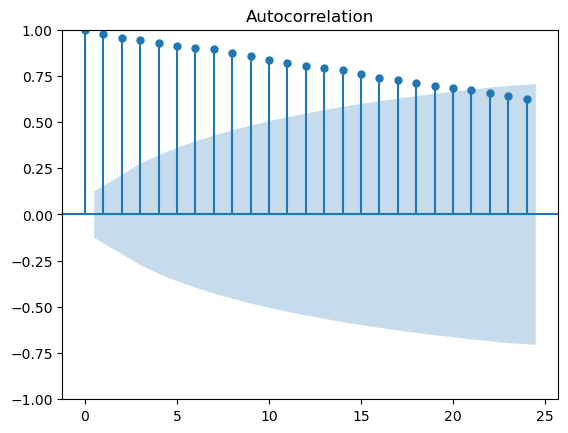

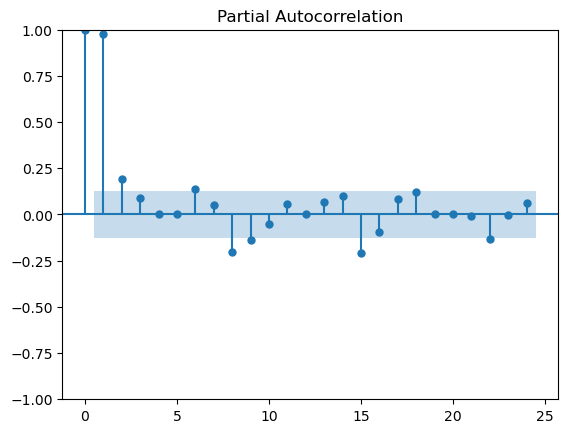

In [71]:
#Let us first test confirmed data of India by differencing by 1
temp = model_df.Confirmed.diff(periods=1)
plot_acf(temp.iloc[1:])
plot_pacf(temp.iloc[1:])
temp

2020-01-22        NaN
2020-01-23        NaN
2020-01-24        0.0
2020-01-25        0.0
2020-01-26        0.0
2020-01-27        0.0
2020-01-28        0.0
2020-01-29        0.0
2020-01-30        1.0
2020-01-31       -1.0
2020-02-01        0.0
2020-02-02        1.0
2020-02-03        0.0
2020-02-04       -1.0
2020-02-05        0.0
2020-02-06        0.0
2020-02-07        0.0
2020-02-08        0.0
2020-02-09        0.0
2020-02-10        0.0
2020-02-11        0.0
2020-02-12        0.0
2020-02-13        0.0
2020-02-14        0.0
2020-02-15        0.0
2020-02-16        0.0
2020-02-17        0.0
2020-02-18        0.0
2020-02-19        0.0
2020-02-20        0.0
2020-02-21        0.0
2020-02-22        0.0
2020-02-23        0.0
2020-02-24        0.0
2020-02-25        0.0
2020-02-26        0.0
2020-02-27        0.0
2020-02-28        0.0
2020-02-29        0.0
2020-03-01        0.0
2020-03-02        2.0
2020-03-03       -2.0
2020-03-04       23.0
2020-03-05      -21.0
2020-03-06       -1.0
2020-03-07

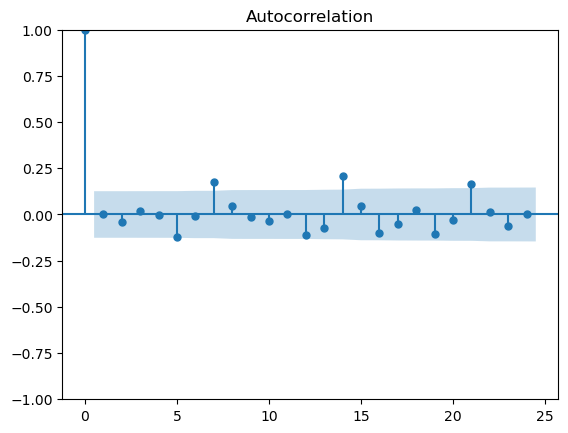

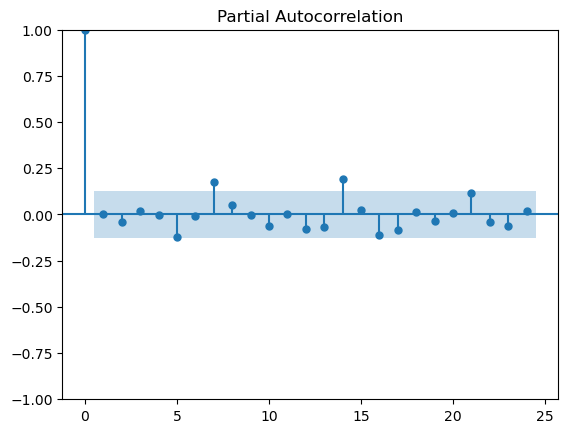

In [72]:
#Differencing the second time.
temp1 = temp.diff(periods=1)
plot_acf(temp1.iloc[2:])
plot_pacf(temp1.iloc[2:])
temp1

2020-02-01        NaN
2020-02-02        1.0
2020-02-03        1.0
2020-02-04        0.0
2020-02-05        0.0
2020-02-06        0.0
2020-02-07        0.0
2020-02-08        0.0
2020-02-09        0.0
2020-02-10        0.0
2020-02-11        0.0
2020-02-12        0.0
2020-02-13        0.0
2020-02-14        0.0
2020-02-15        0.0
2020-02-16        0.0
2020-02-17        0.0
2020-02-18        0.0
2020-02-19        0.0
2020-02-20        0.0
2020-02-21        0.0
2020-02-22        0.0
2020-02-23        0.0
2020-02-24        0.0
2020-02-25        0.0
2020-02-26        0.0
2020-02-27        0.0
2020-02-28        0.0
2020-02-29        0.0
2020-03-01        0.0
2020-03-02        2.0
2020-03-03        0.0
2020-03-04       23.0
2020-03-05        2.0
2020-03-06        1.0
2020-03-07        3.0
2020-03-08        5.0
2020-03-09        4.0
2020-03-10       13.0
2020-03-11        6.0
2020-03-12       11.0
2020-03-13        9.0
2020-03-14       20.0
2020-03-15       11.0
2020-03-16        6.0
2020-03-17

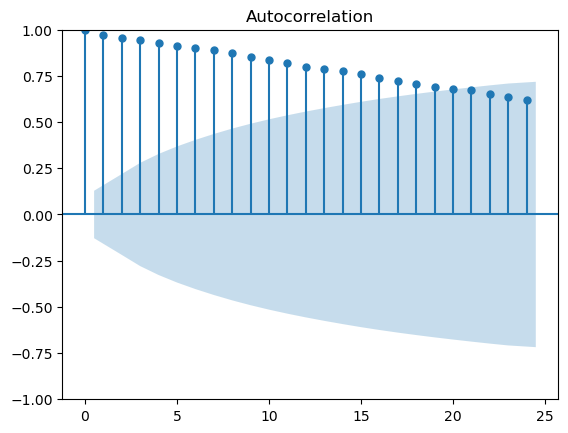

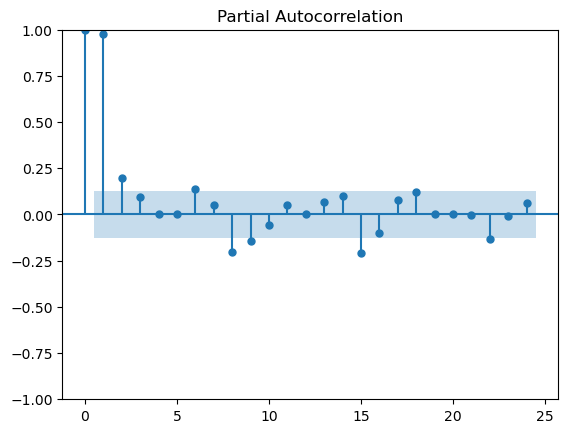

In [73]:
#Even ignoring the first few insignificant rows, the pacf and acf plots are the same.
temp3 = model_df.Confirmed.iloc[10:].diff(periods=1)
plot_acf(temp3.iloc[1:])
plot_pacf(temp3.iloc[1:])
temp3

- The PACF plot reveals that past two terms are sufficient for autoregression and ACF plot reveals (after testing periods for differencing in different combinations) that the required lag for moving averages is around 18 or 19.
- Integrating the series the second time, shows that p can be around 5 or 7 and q can also be 5 or 7.

2020-01-22        NaN
2020-01-23        0.0
2020-01-24        0.0
2020-01-25        0.0
2020-01-26        0.0
2020-01-27        0.0
2020-01-28        0.0
2020-01-29        0.0
2020-01-30        0.0
2020-01-31        0.0
2020-02-01        0.0
2020-02-02        0.0
2020-02-03        0.0
2020-02-04        0.0
2020-02-05        0.0
2020-02-06        0.0
2020-02-07        0.0
2020-02-08        0.0
2020-02-09        0.0
2020-02-10        0.0
2020-02-11        0.0
2020-02-12        0.0
2020-02-13        0.0
2020-02-14        0.0
2020-02-15        0.0
2020-02-16        3.0
2020-02-17        0.0
2020-02-18        0.0
2020-02-19        0.0
2020-02-20        0.0
2020-02-21        0.0
2020-02-22        0.0
2020-02-23        0.0
2020-02-24        0.0
2020-02-25        0.0
2020-02-26        0.0
2020-02-27        0.0
2020-02-28        0.0
2020-02-29        0.0
2020-03-01        0.0
2020-03-02        0.0
2020-03-03        0.0
2020-03-04        0.0
2020-03-05        0.0
2020-03-06        0.0
2020-03-07

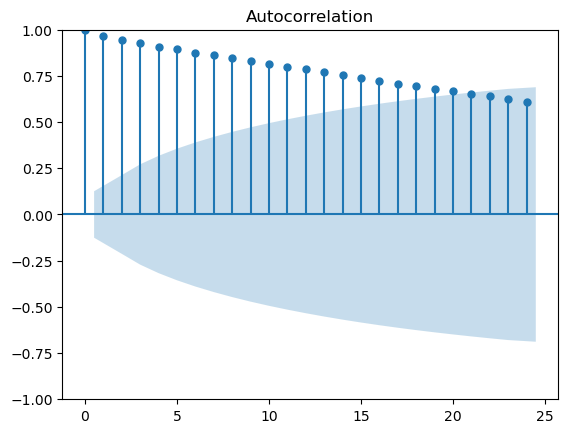

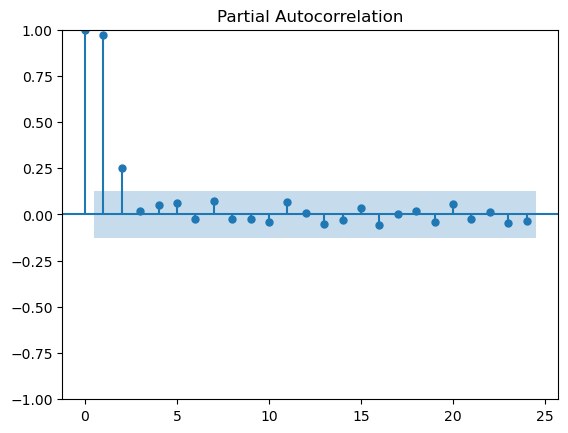

In [74]:
#plotting acf and pacf for recovered data by differencing once
temp = model_df.recovered.diff(periods=1)
plot_acf(temp.iloc[1:])
plot_pacf(temp.iloc[1:])
temp

2020-01-23        NaN
2020-01-24        0.0
2020-01-25        0.0
2020-01-26        0.0
2020-01-27        0.0
2020-01-28        0.0
2020-01-29        0.0
2020-01-30        0.0
2020-01-31        0.0
2020-02-01        0.0
2020-02-02        0.0
2020-02-03        0.0
2020-02-04        0.0
2020-02-05        0.0
2020-02-06        0.0
2020-02-07        0.0
2020-02-08        0.0
2020-02-09        0.0
2020-02-10        0.0
2020-02-11        0.0
2020-02-12        0.0
2020-02-13        0.0
2020-02-14        0.0
2020-02-15        0.0
2020-02-16        3.0
2020-02-17       -3.0
2020-02-18        0.0
2020-02-19        0.0
2020-02-20        0.0
2020-02-21        0.0
2020-02-22        0.0
2020-02-23        0.0
2020-02-24        0.0
2020-02-25        0.0
2020-02-26        0.0
2020-02-27        0.0
2020-02-28        0.0
2020-02-29        0.0
2020-03-01        0.0
2020-03-02        0.0
2020-03-03        0.0
2020-03-04        0.0
2020-03-05        0.0
2020-03-06        0.0
2020-03-07        0.0
2020-03-08

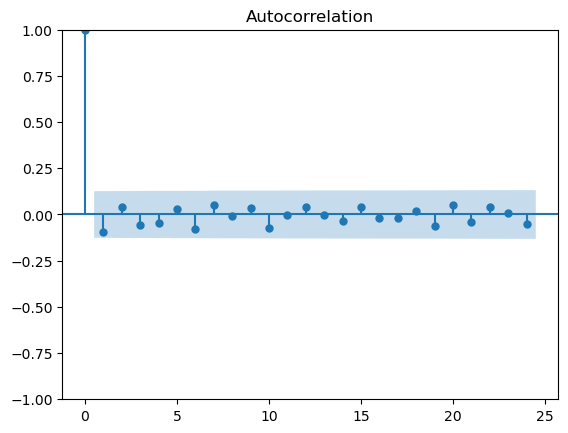

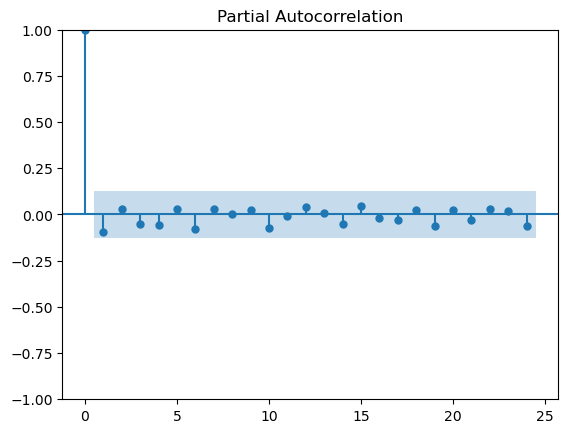

In [75]:
temp1 = temp.iloc[1:].diff(periods=1)
plot_acf(temp1.iloc[1:])
plot_pacf(temp1.iloc[1:])
temp1

In [190]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(temp1.iloc[1:], autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -2.6782113393958826
2. P-Value :  0.07788514299695773
3. Num Of Lags :  12
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 229
5. Critical Values :
	 1% :  -3.4592326027153493
	 5% :  -2.8742454699025872
	 10% :  -2.5735414688888465


- For recovered data of India too, the lag values from acf and pacf are the same as for confirmed cases, which is understood by the pattern of the similarities between the graphs.
- The PACF plot reveals that past two terms are sufficient for autoregression and ACF plot reveals (after testing periods for differencing in different combinations) that the required lag for moving averages is around 18 or 19.
- Integrating the series the second time, shows that p can be around 5 or 7 and q can also be 5 or 7.

2020-01-22       NaN
2020-01-23       0.0
2020-01-24       0.0
2020-01-25       0.0
2020-01-26       0.0
2020-01-27       0.0
2020-01-28       0.0
2020-01-29       0.0
2020-01-30       0.0
2020-01-31       0.0
2020-02-01       0.0
2020-02-02       0.0
2020-02-03       0.0
2020-02-04       0.0
2020-02-05       0.0
2020-02-06       0.0
2020-02-07       0.0
2020-02-08       0.0
2020-02-09       0.0
2020-02-10       0.0
2020-02-11       0.0
2020-02-12       0.0
2020-02-13       0.0
2020-02-14       0.0
2020-02-15       0.0
2020-02-16       0.0
2020-02-17       0.0
2020-02-18       0.0
2020-02-19       0.0
2020-02-20       0.0
2020-02-21       0.0
2020-02-22       0.0
2020-02-23       0.0
2020-02-24       0.0
2020-02-25       0.0
2020-02-26       0.0
2020-02-27       0.0
2020-02-28       0.0
2020-02-29       0.0
2020-03-01       0.0
2020-03-02       0.0
2020-03-03       0.0
2020-03-04       0.0
2020-03-05       0.0
2020-03-06       0.0
2020-03-07       0.0
2020-03-08       0.0
2020-03-09   

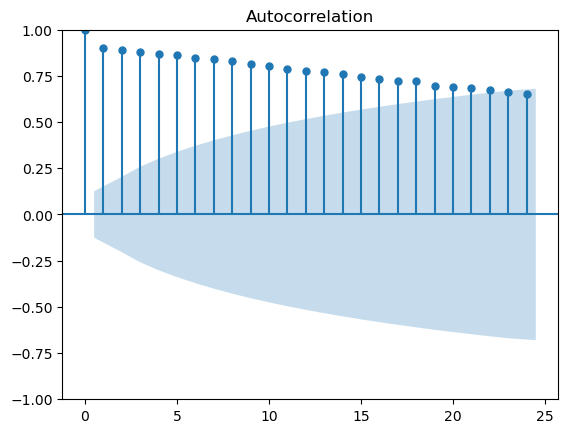

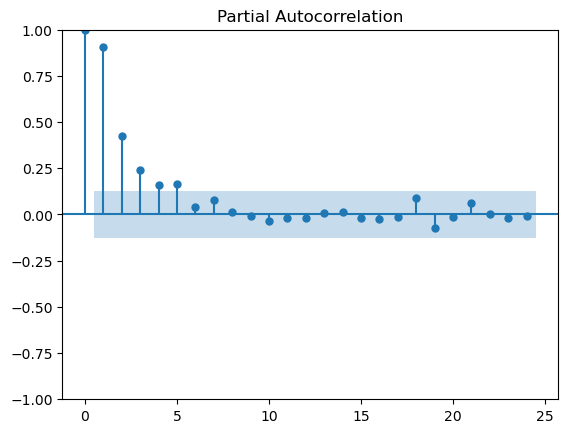

In [76]:
#plotting acf and pacf for deaths data by differencing once
temp = model_df.deaths.diff(periods=1)
plot_acf(temp.iloc[1:])
plot_pacf(temp.iloc[1:])
temp

2020-01-23       NaN
2020-01-24       0.0
2020-01-25       0.0
2020-01-26       0.0
2020-01-27       0.0
2020-01-28       0.0
2020-01-29       0.0
2020-01-30       0.0
2020-01-31       0.0
2020-02-01       0.0
2020-02-02       0.0
2020-02-03       0.0
2020-02-04       0.0
2020-02-05       0.0
2020-02-06       0.0
2020-02-07       0.0
2020-02-08       0.0
2020-02-09       0.0
2020-02-10       0.0
2020-02-11       0.0
2020-02-12       0.0
2020-02-13       0.0
2020-02-14       0.0
2020-02-15       0.0
2020-02-16       0.0
2020-02-17       0.0
2020-02-18       0.0
2020-02-19       0.0
2020-02-20       0.0
2020-02-21       0.0
2020-02-22       0.0
2020-02-23       0.0
2020-02-24       0.0
2020-02-25       0.0
2020-02-26       0.0
2020-02-27       0.0
2020-02-28       0.0
2020-02-29       0.0
2020-03-01       0.0
2020-03-02       0.0
2020-03-03       0.0
2020-03-04       0.0
2020-03-05       0.0
2020-03-06       0.0
2020-03-07       0.0
2020-03-08       0.0
2020-03-09       0.0
2020-03-10   

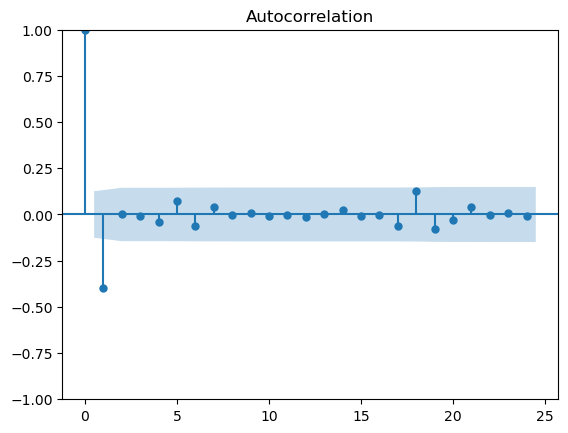

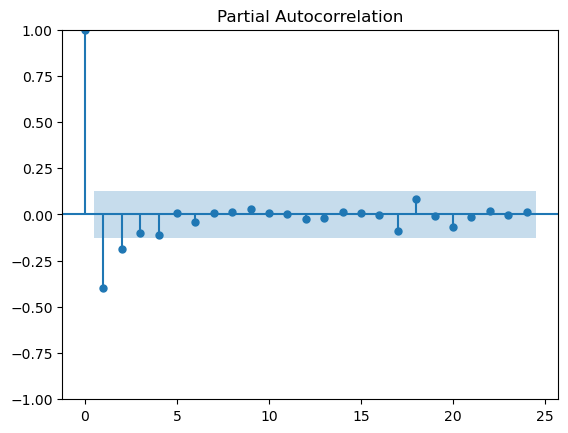

In [77]:
#Differencing the deaths data,for second time, making it second order integration
temp1 = temp.iloc[1:].diff(periods=1)
plot_acf(temp1.iloc[1:])
plot_pacf(temp1.iloc[1:])
temp1

- The deaths data has slightly different correlation of lags as evident from acf and pacf plots
- from the pacf plot, we see that 5 lags may be necessary for auto regressor, while the q value from acf plot can be till 22
- After integrating the second time (finding out differences of the differenced series again), pacf plot reveals p to be 2 and acf plot reveals q to be 1.

## Model Building

In [78]:
#Proceeding to model
model_df.index.size  #Reveals how many rows we have in our data

244

In [91]:
#Creating test train data
train_conf = model_df.Confirmed[:180]
test_conf = model_df.Confirmed[180:]
train_rec = model_df.recovered[:180]
test_rec = model_df.recovered[180:]
train_dth = model_df.deaths[:180]
test_dth = model_df.deaths[180:]

### Auto Regression Model

In [83]:
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.ar_model import ar_select_order  #ar_select_order : gives the best lags ordered as an array
#Searching for best value of lags for confirmed data for autoregression
mod = ar_select_order(model_df.Confirmed,maxlag=20,glob=True)
mod.ar_lags

/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


[1, 4, 6, 8, 10, 14, 15, 17, 18, 20]

/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Text(0.5, 1.0, 'AR model for Confirmed data')

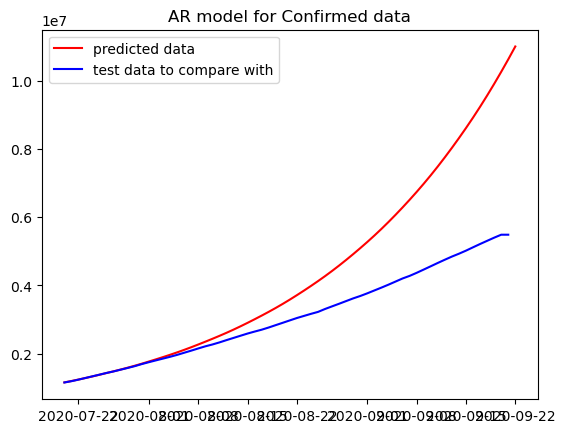

In [112]:
auto_re_conf = AutoReg(train_conf,lags=[1, 4, 6, 8, 10, 14, 15, 17, 18,20])
ar_train = auto_re_conf.fit()
pred_conf = ar_train.predict(start = 180,end=244)
plt.plot(pred_conf,color='red',label='predicted data')
plt.plot(test_conf,color= 'blue',label='test data to compare with')
plt.legend()
plt.title('AR model for Confirmed data')

In [98]:
#Searching for best value of lags for recovered data for autoregression
mod1 = ar_select_order(model_df.recovered,maxlag=20)
mod1.ar_lags

/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


[1, 2, 3, 4, 5, 6, 7, 8]

/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Text(0.5, 1.0, 'AR model for recovered data')

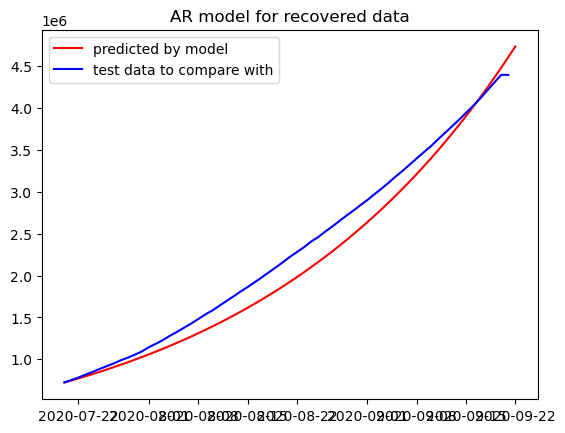

In [113]:
auto_re_rec = AutoReg(train_rec,lags=[1, 2, 3, 4, 5, 6, 7, 8])
ar_train = auto_re_rec.fit()
pred_rec = ar_train.predict(start = 180,end=244)
plt.plot(pred_rec,color='red',label='predicted by model')
plt.plot(test_rec,color= 'blue',label='test data to compare with')
plt.legend()
plt.title('AR model for recovered data')

In [82]:
#Searching for best value of lags for deaths data for autoregression
mod2 = ar_select_order(model_df.deaths,maxlag=20)
mod2.ar_lags

/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


[1, 2, 3, 4, 5, 6]

/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Text(0.5, 1.0, 'AR model for deaths data')

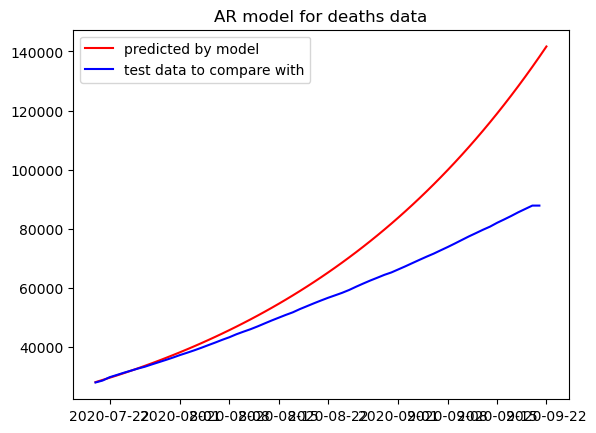

In [114]:
auto_re_dth = AutoReg(train_dth,lags=[1, 2, 3, 4, 5, 6])
ar_train = auto_re_dth.fit()
pred_dth = ar_train.predict(start = 180,end=244)
plt.plot(pred_dth,color='red',label='predicted by model')
plt.plot(test_dth,color= 'blue',label='test data to compare with')
plt.legend()
plt.title('AR model for deaths data')

In [145]:
ar_train.aic

2214.8826873687403

### Moving Averages Model

In [101]:
!pip install pmdarima
from pmdarima.arima import auto_arima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 656.2/656.2 kB 6.8 MB/s eta 0:00:00a 0:00:01


 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=4939.868, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=4941.874, Time=0.03 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=4942.425, Time=0.04 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,2,4)(0,0,0)[0] intercept   : AIC=4922.819, Time=0.15 sec
 ARIMA(0,2,5)(0,0,0)[0] intercept   : AIC=inf, Time=0.37 sec

Best model:  ARIMA(0,2,4)(0,0,0)[0] intercept
Total fit time: 0.798 seconds


/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Text(0.5, 1.0, 'MA model for confirmed data')

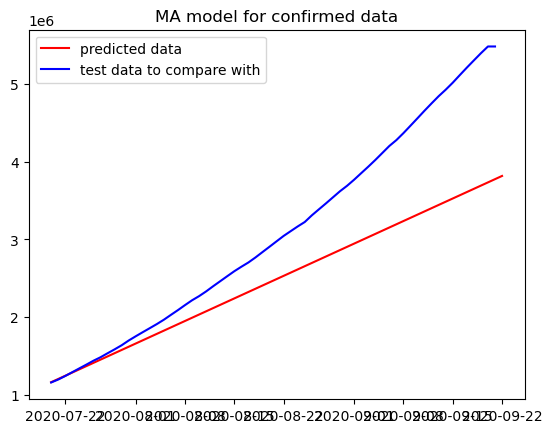

In [115]:
from statsmodels.tsa.arima.model import ARIMA
from pmdarima.arima import auto_arima #Helps to find best values of q for MA method
#MA model for confirmed data
#Trying to find best values for q for confirmed data
model_ma_Conf= auto_arima(model_df.Confirmed,trace=True, error_action='ignore', start_p=0,start_q=0,max_p=0,max_q=10,suppress_warnings=True,stepwise=False,seasonal=False)
model_ma_Conf.fit(model_df.Confirmed).order

#Training and testing model with best parameters found out
MA_model_conf = ARIMA(train_conf,order=model_ma_Conf.fit(model_df.Confirmed).order)
ma_train = MA_model_conf.fit()
pred_conf = ma_train.predict(start = 180,end=244)
plt.plot(pred_conf,color='red',label='predicted data')
plt.plot(test_conf,color= 'blue',label='test data to compare with')
plt.legend()
plt.title('MA model for confirmed data')

 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=4956.086, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=4940.159, Time=0.04 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=4941.637, Time=0.13 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=4958.641, Time=0.07 sec
 ARIMA(0,2,4)(0,0,0)[0] intercept   : AIC=4954.175, Time=0.26 sec
 ARIMA(0,2,5)(0,0,0)[0] intercept   : AIC=4929.606, Time=0.46 sec

Best model:  ARIMA(0,2,5)(0,0,0)[0] intercept
Total fit time: 0.996 seconds


/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Text(0.5, 1.0, 'MA model for recoveered data')

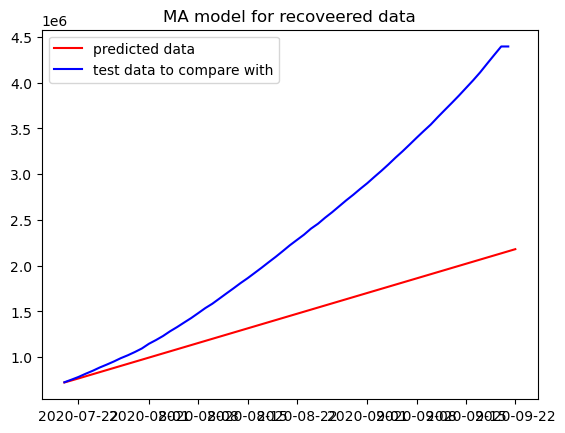

In [117]:
#MA model for recovered data
#Trying to find best values for q for confirmed data
model_ma_rec= auto_arima(model_df.recovered,trace=True, error_action='ignore', start_p=0,start_q=0,max_p=0,max_q=10,suppress_warnings=True,stepwise=False,seasonal=False)
model_ma_rec.fit(model_df.recovered).order

#Training and testing model with best parameters found out
MA_model_rec = ARIMA(train_rec,order=model_ma_Conf.fit(model_df.Confirmed).order)
ma_train = MA_model_rec.fit()
pred_rec = ma_train.predict(start = 180,end=244)
plt.plot(pred_rec,color='red',label='predicted data')
plt.plot(test_rec,color= 'blue',label='test data to compare with')
plt.legend()
plt.title('MA model for recoveered data')

 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=3203.458, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=3107.271, Time=0.07 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=3109.223, Time=0.13 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=3111.179, Time=0.22 sec
 ARIMA(0,2,4)(0,0,0)[0] intercept   : AIC=3112.395, Time=0.29 sec
 ARIMA(0,2,5)(0,0,0)[0] intercept   : AIC=3113.824, Time=0.36 sec

Best model:  ARIMA(0,2,1)(0,0,0)[0] intercept
Total fit time: 1.103 seconds


/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/subbalakshmivedam/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Text(0.5, 1.0, 'MA model for death data')

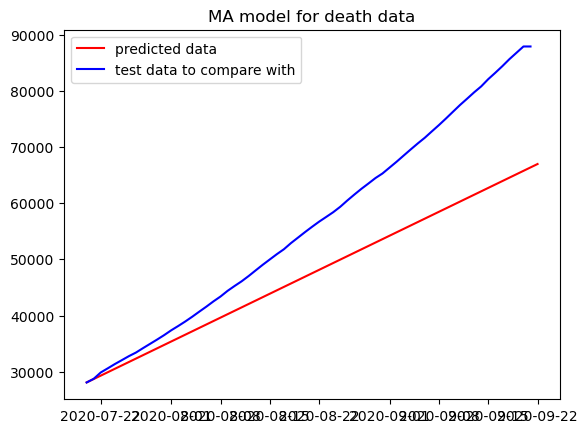

In [116]:
#MA model for death data
#Trying to find best values for q for confirmed data
model_ma_dth= auto_arima(model_df.deaths,trace=True, error_action='ignore', start_p=0,start_q=0,max_p=0,max_q=10,suppress_warnings=True,stepwise=False,seasonal=False)
model_ma_dth.fit(model_df.deaths).order

#Training and testing model with best parameters found out
MA_model_dth = ARIMA(train_dth,order=model_ma_Conf.fit(model_df.Confirmed).order)
ma_train = MA_model_dth.fit()
pred_dth = ma_train.predict(start = 180,end=244)
plt.plot(pred_dth,color='red',label='predicted data')
plt.plot(test_dth,color= 'blue',label='test data to compare with')
plt.legend()
plt.title('MA model for death data')

- It can be seen that the Regression technique predicated higher values than actual, while MA technique predicted lesser values. A combination of both, with right integration may work in best way.
- We'll implement ARIMA model which is best combination of both techniques.

### ARIMA model

#### ARIMA model for confirmed cases

In [120]:
# Finding best parameters for arima model
import itertools
p = range(2,5)
q = range(2,20,2)
d = range(1,5)
pdq = list(itertools.product(p,d,q))
pdq

[(2, 1, 2),
 (2, 1, 4),
 (2, 1, 6),
 (2, 1, 8),
 (2, 1, 10),
 (2, 1, 12),
 (2, 1, 14),
 (2, 1, 16),
 (2, 1, 18),
 (2, 2, 2),
 (2, 2, 4),
 (2, 2, 6),
 (2, 2, 8),
 (2, 2, 10),
 (2, 2, 12),
 (2, 2, 14),
 (2, 2, 16),
 (2, 2, 18),
 (2, 3, 2),
 (2, 3, 4),
 (2, 3, 6),
 (2, 3, 8),
 (2, 3, 10),
 (2, 3, 12),
 (2, 3, 14),
 (2, 3, 16),
 (2, 3, 18),
 (2, 4, 2),
 (2, 4, 4),
 (2, 4, 6),
 (2, 4, 8),
 (2, 4, 10),
 (2, 4, 12),
 (2, 4, 14),
 (2, 4, 16),
 (2, 4, 18),
 (3, 1, 2),
 (3, 1, 4),
 (3, 1, 6),
 (3, 1, 8),
 (3, 1, 10),
 (3, 1, 12),
 (3, 1, 14),
 (3, 1, 16),
 (3, 1, 18),
 (3, 2, 2),
 (3, 2, 4),
 (3, 2, 6),
 (3, 2, 8),
 (3, 2, 10),
 (3, 2, 12),
 (3, 2, 14),
 (3, 2, 16),
 (3, 2, 18),
 (3, 3, 2),
 (3, 3, 4),
 (3, 3, 6),
 (3, 3, 8),
 (3, 3, 10),
 (3, 3, 12),
 (3, 3, 14),
 (3, 3, 16),
 (3, 3, 18),
 (3, 4, 2),
 (3, 4, 4),
 (3, 4, 6),
 (3, 4, 8),
 (3, 4, 10),
 (3, 4, 12),
 (3, 4, 14),
 (3, 4, 16),
 (3, 4, 18),
 (4, 1, 2),
 (4, 1, 4),
 (4, 1, 6),
 (4, 1, 8),
 (4, 1, 10),
 (4, 1, 12),
 (4, 1, 14),
 (4, 1, 1

In [123]:
len(pdq)

108

(2, 1, 2) 3096.3429994336093
(2, 1, 4) 2890.29973170504
(2, 1, 6) 2853.7432204896118
(2, 1, 8) 2828.3041424372886
(2, 1, 10) 2827.4318459372644
(2, 1, 12) 2880.272595766718
(2, 1, 14) 2825.22176159589
(2, 1, 16) 2828.4587473648626
(2, 1, 18) 2832.3784525956103
(2, 2, 2) 2829.6987610667275
(2, 2, 4) 2820.753655286858
(2, 2, 6) 2815.094344594062
(2, 2, 8) 2807.2780131778914
(2, 2, 10) 2817.376479967328
(2, 2, 12) 2806.679010791552
(2, 2, 14) 2810.939978037689
(2, 2, 16) 2810.8189309218933
(2, 2, 18) 2829.153268400554
(2, 3, 2) 2799.347333471973
(2, 3, 4) 2803.0424211334857
(2, 3, 6) 2789.143937908176
(2, 3, 8) 2786.2588532936743
(2, 3, 10) 2805.6144319903406
(2, 3, 12) 2801.752447992382
(2, 3, 14) 2805.3974109065
(2, 3, 16) 2802.6233677935725
(2, 3, 18) 2808.1956674285966
(2, 4, 2) 2871.272940232701
(2, 4, 4) 2800.738117254119
(2, 4, 6) 2807.328602796716
(2, 4, 8) 2806.6923298217334
(2, 4, 10) 2826.2169497086534
(2, 4, 12) 2834.3002245420357
(2, 4, 14) 2838.126810967438
(2, 4, 16) 2834.1

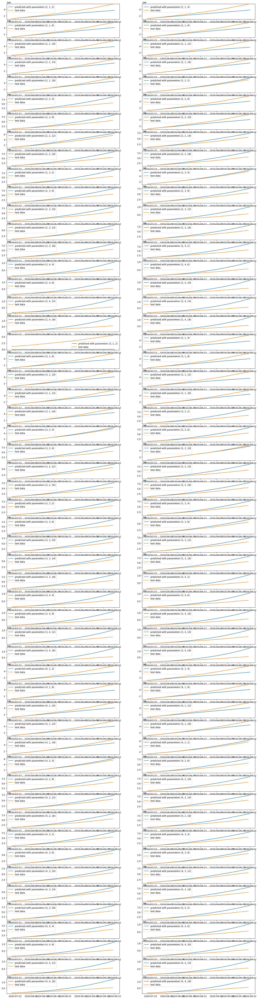

In [129]:
import warnings
warnings.filterwarnings('ignore')
aic_list = []
plt.figure(figsize = (20,80))
plt_num = 1
for i in pdq:
    plt.subplot(int(len(pdq)/2),2,plt_num)
    ARIMA_train = ARIMA(train_conf,order=i)
    arima_model = ARIMA_train.fit()
    print(i,arima_model.aic)
    aic_list.append(arima_model.aic)
    pred_conf = arima_model.predict(start = 180,end=244)
    plt.plot(pred_conf,label='predicted with parameters ' + str(i))
    plt.plot(test_conf,label = 'test data')
    plt_num += 1
    plt.legend()

(2, 2, 2) 2829.6987610667275
(2, 3, 4) 2803.0424211334857
(3, 2, 4) 2820.4591260047946
(3, 2, 10) 2817.466816409948
(4, 2, 2) 2829.8798359073007
(4, 2, 4) 2818.446772699106


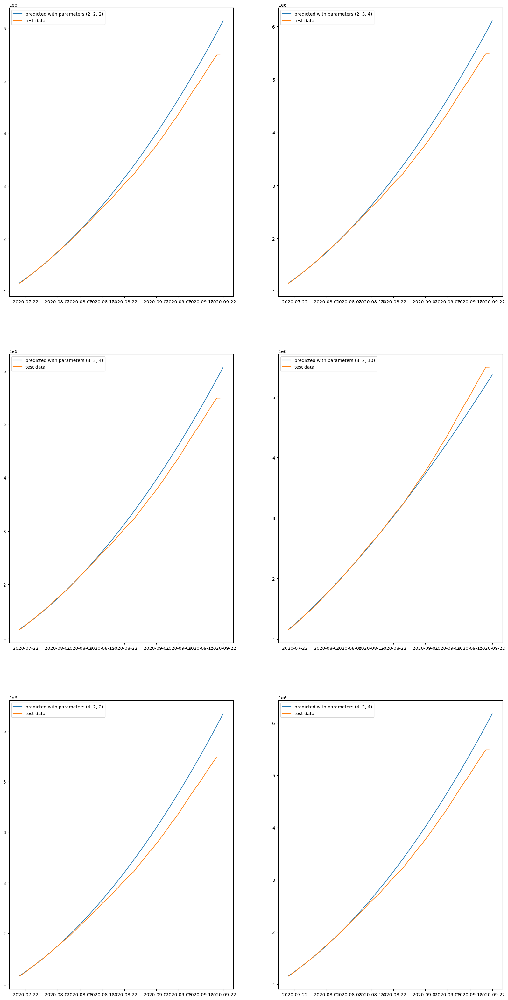

In [136]:
# Using best parameters
import warnings
warnings.filterwarnings('ignore')
aic_list = []
plt.figure(figsize = (20,40))
plt_num = 1
for i in [(2,2,2),(2,3,4),(3,2,4),(3,2,10),(4,2,2),(4,2,4)]:
    plt.subplot(3,2,plt_num)
    ARIMA_train = ARIMA(train_conf,order=i)
    arima_model = ARIMA_train.fit()
    print(i,arima_model.aic)
    aic_list.append(arima_model.aic)
    pred_conf = arima_model.predict(start = 180,end=244)
    plt.plot(pred_conf,label='predicted with parameters ' + str(i))
    plt.plot(test_conf,label = 'test data')
    plt_num += 1
    plt.legend()

#### Observations for ARIMA model for confirmed India cases:
- From the graphs and data, it is evident that aic value isn't the right criterion always, as least aic sometime gives bad graph too.
- The parameters that worked best are (2,2,2),(2,3,4),(3,2,4),(3,2,10),(4,2,2),(4,2,4)
- Of all these parameters, (3,2,10) seems to be the best parameters for our ARIMA model for confirmed cases of India with aic of 2817. 

#### ARIMA model for death cases

(2, 1, 2) 2278.729709091337
(2, 1, 4) 2281.8253436564437
(2, 1, 6) 2284.505648665229
(2, 1, 8) 2288.865680367414
(2, 1, 10) 2293.3801641888695
(2, 1, 12) 2296.2337590065176
(2, 1, 14) 2301.192988217267
(2, 1, 16) 38.0
(2, 1, 18) 2308.401606015792
(2, 2, 2) 2263.6208347056972
(2, 2, 4) 2263.539672440609
(2, 2, 6) 2269.872379007782
(2, 2, 8) 2275.9423290227314
(2, 2, 10) 2273.4538513182843
(2, 2, 12) 2280.824040004162
(2, 2, 14) 2285.632895957038
(2, 2, 16) 2299.001092142583
(2, 2, 18) 2289.0343286766765
(2, 3, 2) 2256.0775571180857
(2, 3, 4) 2256.6135074693266
(2, 3, 6) 2260.4791038511657
(2, 3, 8) 2263.9480179933694
(2, 3, 10) 2270.3111342468965
(2, 3, 12) 2274.0440231016346
(2, 3, 14) 2276.463166161849
(2, 3, 16) 2293.1198800556504
(2, 3, 18) 2284.6176361243533
(2, 4, 2) 2286.647902932664
(2, 4, 4) 2259.5548628390934
(2, 4, 6) 2262.5098167530464
(2, 4, 8) 2267.139083679861
(2, 4, 10) 2268.9975892674447
(2, 4, 12) 2272.3756317923035
(2, 4, 14) 2276.420480354563
(2, 4, 16) 2280.23409075

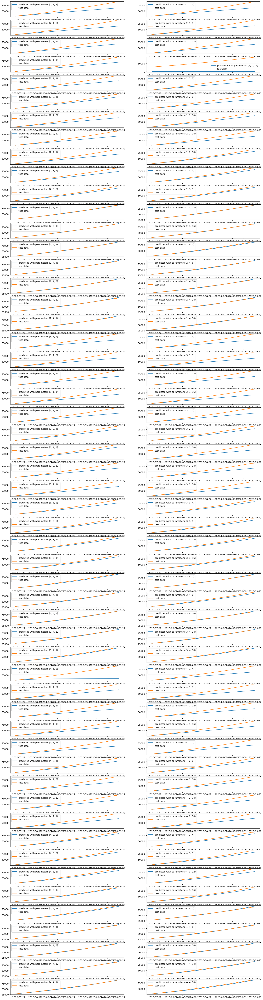

In [137]:
import warnings
warnings.filterwarnings('ignore')
aic_list = []
plt.figure(figsize = (20,80))
plt_num = 1
#Using same p,d,q, since the pacf and acf plots revealed same ranges for p, d, q  for death cases as confirmed cases
for i in pdq:
    plt.subplot(int(len(pdq)/2),2,plt_num)
    ARIMA_train = ARIMA(train_dth,order=i)
    arima_model = ARIMA_train.fit()
    print(i,arima_model.aic)
    aic_list.append(arima_model.aic)
    pred_dth = arima_model.predict(start = 180,end=244)
    plt.plot(pred_dth,label='predicted with parameters ' + str(i))
    plt.plot(test_dth,label = 'test data')
    plt_num += 1
    plt.legend()

(2, 3, 10) 2270.3111342468965
(2, 3, 12) 2274.0440231016346
(2, 3, 14) 2276.463166161849
(2, 3, 16) 2293.1198800556504
(2, 3, 18) 2284.6176361243533
(2, 4, 2) 2286.647902932664
(2, 4, 4) 2259.5548628390934
(2, 4, 6) 2262.5098167530464
(2, 4, 8) 2267.139083679861
(2, 4, 10) 2268.9975892674447
(2, 4, 12) 2272.3756317923035
(2, 4, 14) 2276.420480354563
(2, 4, 16) 2280.2340907549046
(2, 4, 18) 2353.875573949993
(3, 4, 2) 2279.7865918881753
(3, 4, 4) 2260.502720901718
(3, 4, 8) 2289.9785468960504
(3, 4, 10) 2273.1801930801457
(3, 4, 12) 2284.5721074147286
(3, 4, 14) 2294.2412726172297
(4, 4, 2) 2269.9567772218115
(4, 4, 4) 2296.7994542572096
(4, 4, 6) 2267.4524394130303
(4, 4, 8) 2289.348819117885
(4, 4, 10) 2291.7481706859116
(4, 4, 12) 2297.2638967193616
(4, 4, 14) 2305.2091227637966
(4, 4, 16) 2312.8497568015646
(4, 4, 18) 2330.633962345629


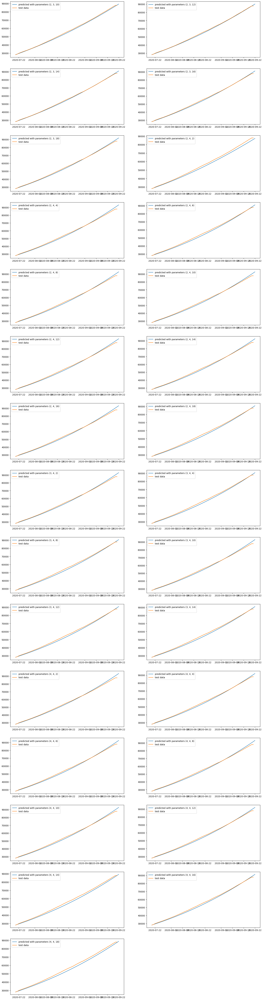

In [142]:
# Using best parameters
import warnings
warnings.filterwarnings('ignore')
aic_list = []
plt.figure(figsize = (20,80))
plt_num = 1
for i in [(2,3,10),(2,3,12),(2,3,14),(2,3,16),(2,3,18),(2,4,2),(2,4,4),(2,4,6),(2,4,8),(2,4,10),(2,4,12),(2,4,14),(2,4,16),(2,4,18),(3,4,2),(3,4,4),(3,4,8),(3,4,10),(3,4,12),(3,4,14),(4,4,2),(4,4,4),(4,4,6),(4,4,8),(4,4,10),(4,4,12),(4,4,14),(4,4,16),(4,4,18)]:
    plt.subplot(15,2,plt_num)
    ARIMA_train = ARIMA(train_dth,order=i)
    arima_model = ARIMA_train.fit()
    print(i,arima_model.aic)
    aic_list.append(arima_model.aic)
    pred_dth = arima_model.predict(start = 180,end=244)
    plt.plot(pred_dth,label='predicted with parameters ' + str(i))
    plt.plot(test_dth,label = 'test data')
    plt_num += 1
    plt.legend()

#### Observations for ARIMA model for death cases in India:
- From the graphs and data, it is evident that aic value isn't the right criterion always, as least aic sometime gives bad graph too.
- The parameters that worked best are (2,3,10),(2,3,12),(2,3,14),(2,3,16),(2,3,18),(2,4,2),(2,4,4),(2,4,6),(2,4,8),(2,4,10),(2,4,12),(2,4,14),(2,4,16),(2,4,18),(3,4,2),(3,4,4),(3,4,8),(3,4,10),(3,4,12),(3,4,14),(4,4,2),(4,4,4),(4,4,6),(4,4,8),(4,4,10),(4,4,12),(4,4,14),(4,4,16),(4,4,18).
- Of all these parameters, most match with the graph of test data exactly. But it is important to note the tail end and rise in curve (curve slope) since it'll be more useful for future data. In this regard, (2,4,2) seems to be the best parameters for our ARIMA model for death cases of India with aic of 2286. 

#### ARIMA Model for recovered cases India

(2, 1, 2) 3084.2422255773067
(2, 1, 4) 3115.8392232573115
(2, 1, 6) 3109.2312668854393
(2, 1, 8) 3097.945176611888
(2, 1, 10) 3102.520141028432
(2, 1, 12) 3102.6310887282752
(2, 1, 14) 3096.237047698705
(2, 1, 16) 3092.7572504780414
(2, 1, 18) 3100.802581258367
(2, 2, 2) 3061.08749802917
(2, 2, 4) 3067.163324255692
(2, 2, 6) 3073.1984469142963
(2, 2, 8) 3080.735915318409
(2, 2, 10) 3070.0010988720505
(2, 2, 12) 3073.1018065579956
(2, 2, 14) 3062.1024929981195
(2, 2, 16) 3070.9668085023895
(2, 2, 18) 3084.7471650756424
(2, 3, 2) 3088.7661886296883
(2, 3, 4) 3043.7272774197486
(2, 3, 6) 3060.7018162496624
(2, 3, 8) 3072.8853944034245
(2, 3, 10) 3071.349267711118
(2, 3, 12) 3069.4756271028327
(2, 3, 14) 3057.2363023615353
(2, 3, 16) 3066.3276859766765
(2, 3, 18) 3085.205957140202
(2, 4, 2) 3065.097183138245
(2, 4, 4) 3035.9683686863536
(2, 4, 6) 3104.608769148166
(2, 4, 8) 3114.2117204542533
(2, 4, 10) 3126.5743813600125
(2, 4, 12) 3131.3983809091733
(2, 4, 14) 3110.148036188937
(2, 4, 16

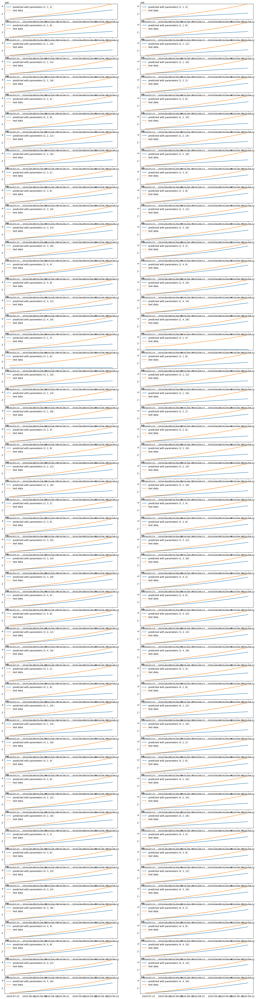

In [143]:
import warnings
warnings.filterwarnings('ignore')
aic_list = []
plt.figure(figsize = (20,80))
plt_num = 1
#Using same p,d,q, since the pacf and acf plots revealed same ranges for p, d, q  for recovered cases as confirmed cases
for i in pdq:
    plt.subplot(int(len(pdq)/2),2,plt_num)
    ARIMA_train = ARIMA(train_rec,order=i)
    arima_model = ARIMA_train.fit()
    print(i,arima_model.aic)
    aic_list.append(arima_model.aic)
    pred_rec = arima_model.predict(start = 180,end=244)
    plt.plot(pred_rec,label='predicted with parameters ' + str(i))
    plt.plot(test_rec,label = 'test data')
    plt_num += 1
    plt.legend()

(3, 4, 2) 3057.6620786565404 1766183.7060378813
(3, 4, 4) 3052.0167708070917 1513264.5992557907
(4, 4, 10) 3081.775380235788 1497042.3960130538


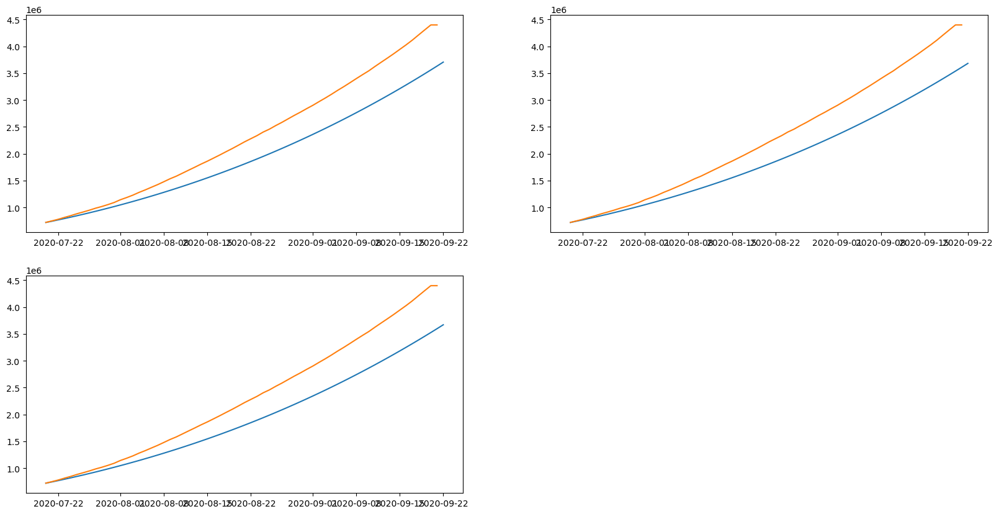

In [148]:
# Using best parameters
import warnings
warnings.filterwarnings('ignore')
aic_list = []
plt.figure(figsize = (20,10))
plt_num = 1
for i in [(3,4,2),(3,4,4),(4,4,10)]:
    plt.subplot(2,2,plt_num)
    ARIMA_train = ARIMA(train_rec,order=i)
    arima_model = ARIMA_train.fit()
    print(i,arima_model.aic,arima_model.mse)
    aic_list.append(arima_model.aic)
    pred_rec = arima_model.predict(start = 180,end=244)
    plt.plot(pred_rec,label='predicted with parameters ' + str(i))
    plt.plot(test_rec,label = 'test data')
    plt_num += 1

#### Observations for ARIMA model for confirmed India cases:
- From the graphs and data, it is evident that aic value isn't the right criterion always, as least aic sometime gives bad graph too.
- The parameters that worked best are (3,4,2),(3,4,4),(4,4,10)
- Of all these parameters, (3,4,2) seems to be the best parameters for our ARIMA model for recovered cases of India with aic of 3057. 

# Task 2: Choosing a region and constructing models to predict a part of its data.
- The region chosen is India. Models that use AR, MA and ARIMA are chosen to develop a model that predicts a set of data, by training from a set of offered training data.
- Of these AR models predicted optimistically (more than their actual test values), while MA models predicted pessimistically (less than their actual test values). Hence a combination of those models, with possibility of integration, ARIMA model is chosen. 
- A set of values of p,d,q are defined, based on acf and pacf plots and the model is trained for each of the combinations of p,d,q. The model is then tested against a set of data which is taken as test data and compared with their actual values. The graphs are analysed and best values of p,d,q are filtered out. Aic failed to function as a filtering criteria, because the predicted data graph really lacks match with test data graph.
- The filtered out values of p,d,q are further examined, and best combination of p,d,q are presented with its aic value.
- This model can be generalised for any country/region, by changing the value of variable 'country' at the beginning of task 2, and the entire code/model may be run again to develop a model for that country for either or all of confirmed, recovered and death cases. 


# Task 3: Suggestions to the health department of the India :
- There shall be more than linear rise in the confirmed cases and deaths and it may turn exponential if not addressed sooner. 
- It is more important to arrange medical facilities to cater to this exponential rise in confirmed cases and minimise deaths.
- People should be more cautious and follow all preventory mechanisms.